In [27]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
# Set style for better visualizations
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)
print("All libraries imported successfully!")

All libraries imported successfully!


In [28]:

# Import community detection libraries
try:
    import community as community_louvain
    print("python-louvain already installed")
except ImportError:
    print("Installing python-louvain...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'python-louvain'])
    import community as community_louvain

from networkx.algorithms import community as nx_community

python-louvain already installed


In [3]:
# =============================================================================
# LOAD TWITCH LANGUAGE NETWORKS
# =============================================================================
# DE (German), ENGB (English), ES (Spanish), FR (French), RU (Russian)

# Define the language networks to load
languages = ['DE', 'ENGB', 'ES', 'FR', 'RU']
# languages = ['ENGB']

base_path = 'twitch/'

# Store data for each language
all_edges = []
all_targets = []
node_offsets = {}  # Track node ID offset for each language
current_offset = 0

print("="*70)
print("LOADING ALL TWITCH LANGUAGE NETWORKS")
print("="*70)

network_stats = []

for lang in languages:
    print(f"\nLoading {lang} network...")
    edges_path = f'{base_path}{lang}/musae_{lang}_edges.csv'
    target_path = f'{base_path}{lang}/musae_{lang}_target.csv'
    
    # Load edges
    edges_df = pd.read_csv(edges_path)
    
    # Load target data
    target_df = pd.read_csv(target_path)
    
    # Get number of nodes in this network
    num_nodes = len(target_df)
    
    # Store the offset for this language
    node_offsets[lang] = current_offset
    
    # Apply offset to edges (shift node IDs to avoid conflicts)
    edges_df['from'] = edges_df['from'] + current_offset
    edges_df['to'] = edges_df['to'] + current_offset
    edges_df['language'] = lang
    
    # Apply offset to target data
    target_df['new_id'] = target_df['new_id'] + current_offset
    target_df['language'] = lang
    
    # Store data
    all_edges.append(edges_df)
    all_targets.append(target_df)
    
    # Track statistics
    stats = {
        'Language': lang,
        'Nodes': num_nodes,
        'Edges': len(edges_df),
        'Offset': current_offset
    }
    network_stats.append(stats)
    
    print(f"   Nodes: {num_nodes:,}, Edges: {len(edges_df):,}, Offset: {current_offset:,}")
    
    # Update offset for next language
    current_offset += num_nodes

# Combine all data
combined_edges_df = pd.concat(all_edges, ignore_index=True)
combined_target_df = pd.concat(all_targets, ignore_index=True)

print("\n" + "="*70)
print("COMBINED NETWORK SUMMARY")
print("="*70)
stats_df = pd.DataFrame(network_stats)
print(stats_df.to_string(index=False))
print(f"\nTOTAL: {combined_target_df.shape[0]:,} nodes, {combined_edges_df.shape[0]:,} edges")


target_df = combined_target_df


LOADING ALL TWITCH LANGUAGE NETWORKS

Loading DE network...
   Nodes: 9,498, Edges: 153,138, Offset: 0

Loading ENGB network...
   Nodes: 7,126, Edges: 35,324, Offset: 9,498

Loading ES network...
   Nodes: 4,648, Edges: 59,382, Offset: 16,624

Loading FR network...
   Nodes: 6,551, Edges: 112,666, Offset: 21,272

Loading RU network...
   Nodes: 4,385, Edges: 37,304, Offset: 27,823

COMBINED NETWORK SUMMARY
Language  Nodes  Edges  Offset
      DE   9498 153138       0
    ENGB   7126  35324    9498
      ES   4648  59382   16624
      FR   6551 112666   21272
      RU   4385  37304   27823

TOTAL: 32,208 nodes, 397,814 edges


In [ ]:
# Use combined target data

# print("Combined Target Data Preview:")
# print(target_df.head(10))
# print(f"\nShape: {target_df.shape}")
# print(f"Columns: {target_df.columns.tolist()}")

# # Display basic statistics
# print("\n" + "="*60)
# print("BASIC STATISTICS OF NODE ATTRIBUTES (All Languages)")
# print("="*60)
# print(target_df.describe())

# # Statistics by language
# print("\n" + "="*60)
# print("STATISTICS BY LANGUAGE COMMUNITY")
# print("="*60)
# lang_stats = target_df.groupby('language').agg({
#     'new_id': 'count',
#     'days': 'mean',
#     'views': 'mean',
#     'mature': 'mean',
#     'partner': 'mean'
# }).round(2)
# lang_stats.columns = ['Nodes', 'Avg Days', 'Avg Views', 'Mature %', 'Partner %']
# lang_stats['Mature %'] = (lang_stats['Mature %'] * 100).round(1)
# lang_stats['Partner %'] = (lang_stats['Partner %'] * 100).round(1)
# print(lang_stats)

In [4]:
# Load features JSON for all networks used for node classification

all_features = {}
print("="*70)
print("LOADING NODE FEATURES")
print("="*70)

for lang in languages:
    try:
        if lang == 'DE':
            features_path = f'{base_path}DE/musae_DE.json'  # Different naming
        else:
            features_path = f'{base_path}{lang}/musae_{lang}_features.json'
        
        with open(features_path, 'r') as f:
            features_dict = json.load(f)
        
        # Apply node offset to feature keys
        offset = node_offsets[lang]
        for key, value in features_dict.items():
            new_key = str(int(key) + offset)
            all_features[new_key] = value
        
        print(f"{lang}: {len(features_dict)} nodes loaded")
    except Exception as e:
        print(f"{lang}: Could not load features - {e}")

print(f"\nTotal nodes with features: {len(all_features)}")
if all_features:
    sample_key = list(all_features.keys())[0]
    print(f"Feature vector length: {len(all_features[sample_key])}")

LOADING NODE FEATURES
DE: 9498 nodes loaded
ENGB: 7126 nodes loaded
ES: 4648 nodes loaded
FR: 6549 nodes loaded
RU: 4385 nodes loaded

Total nodes with features: 32206
Feature vector length: 25


In [6]:
# Create an undirected graph from the COMBINED edge list
G = nx.from_pandas_edgelist(combined_edges_df, source='from', target='to')

print("="*70)
print("COMBINED MULTI-LANGUAGE GRAPH CREATED")
print("="*70)
print(f"\nTotal Nodes: {G.number_of_nodes():,}")
print(f"Total Edges: {G.number_of_edges():,}")
print(f"Graph type: {type(G)}")

# Check connected components
num_components = nx.number_connected_components(G)
print(f"\nConnected Components: {num_components}")

if num_components > 1:
    components = list(nx.connected_components(G))
    component_sizes = [len(c) for c in components]
    print(f"   (Each language network forms its own component since there are")
    print(f"    no cross-language friendships in the dataset)")
    print(f"\n   Component sizes: {sorted(component_sizes, reverse=True)}")

COMBINED MULTI-LANGUAGE GRAPH CREATED

Total Nodes: 32,206
Total Edges: 397,814
Graph type: <class 'networkx.classes.graph.Graph'>

Connected Components: 5
   (Each language network forms its own component since there are
    no cross-language friendships in the dataset)

   Component sizes: [9498, 7126, 6549, 4648, 4385]


In [24]:
print("="*70)
print("DATA QUALITY CHECK")
print("="*70)

# Check for missing values in target_df
print("\nMissing values in target data:")
print(target_df.isnull().sum())

# Check if all nodes in the graph have corresponding entries in target_df
graph_nodes = set(G.nodes())
target_nodes = set(target_df['new_id'])

print(f"\nNodes in graph: {len(graph_nodes)}")
print(f"Nodes in target data: {len(target_nodes)}")
print(f"Nodes in both: {len(graph_nodes.intersection(target_nodes))}")
print(f"Nodes only in graph: {len(graph_nodes - target_nodes)}")
print(f"Nodes only in target: {len(target_nodes - graph_nodes)}")

# Check features
features_nodes = set(map(int, features_dict.keys()))
print(f"\nNodes in features: {len(features_nodes)}")
print(f"Nodes in graph AND features: {len(graph_nodes.intersection(features_nodes))}")

print("\nData loaded and validated successfully!")

DATA QUALITY CHECK

Missing values in target data:
id          0
days        0
mature      0
views       0
partner     0
new_id      0
language    0
dtype: int64

Nodes in graph: 32206
Nodes in target data: 32206
Nodes in both: 32206
Nodes only in graph: 0
Nodes only in target: 0

Nodes in features: 4385
Nodes in graph AND features: 4385

Data loaded and validated successfully!


In [25]:
# Add attributes from combined target_df to the graph (including language)
# Check for duplicates first
print(f"Checking data: {len(target_df)} rows, {target_df['new_id'].nunique()} unique new_ids")

# Handle potential duplicates by keeping first occurrence
target_df_unique = target_df.drop_duplicates(subset='new_id', keep='first')
print(f"After deduplication: {len(target_df_unique)} rows")

new_id_to_row = target_df_unique.set_index('new_id').to_dict('index')

# Add node attributes
for node in G.nodes():
    if node in new_id_to_row:
        row_data = new_id_to_row[node]
        # Add each attribute including language
        G.nodes[node]['days'] = row_data['days']
        G.nodes[node]['mature'] = row_data['mature']
        G.nodes[node]['views'] = row_data['views']
        G.nodes[node]['partner'] = row_data['partner']
        G.nodes[node]['language'] = row_data['language']

Checking data: 32208 rows, 32206 unique new_ids
After deduplication: 32206 rows


In [8]:
print("="*70)
print("BASIC NETWORK STATISTICS - Combined Multi-Language Twitch Network")
print("="*70)

# Basic counts
stats = {}
stats['nodes'] = G.number_of_nodes()
stats['edges'] = G.number_of_edges()

# Density
stats['density'] = nx.density(G)

# Transitivity (clustering coefficient)
print("\nComputing transitivity (this may take a few minutes for large networks)...")
stats['transitivity'] = nx.transitivity(G)
stats['avg_clustering'] = nx.average_clustering(G)

# Degree statistics
degrees = [d for n, d in G.degree()]
stats['avg_degree'] = np.mean(degrees)
stats['median_degree'] = np.median(degrees)
stats['max_degree'] = np.max(degrees)
stats['min_degree'] = np.min(degrees)

# Connected components
if nx.is_connected(G):
    stats['connected_components'] = 1
    stats['largest_cc_size'] = stats['nodes']
else:
    components = list(nx.connected_components(G))
    stats['connected_components'] = len(components)
    stats['largest_cc_size'] = len(max(components, key=len))
    stats['largest_cc_fraction'] = stats['largest_cc_size'] / stats['nodes']

# Display statistics
print("\n" + "="*70)
print("OVERALL NETWORK STATISTICS")
print("="*70)
for key, value in stats.items():
    if isinstance(value, float):
        print(f"{key.replace('_', ' ').title():<30} {value:.6f}")
    else:
        print(f"{key.replace('_', ' ').title():<30} {value}")

# Statistics by language component
print("\n" + "="*70)
print("STATISTICS BY LANGUAGE NETWORK")
print("="*70)
for lang in languages:
    # Get nodes for this language
    lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
    lang_subgraph = G.subgraph(lang_nodes)
    lang_degrees = [d for n, d in lang_subgraph.degree()]
    
    print(f"\n{lang}:")
    print(f"   Nodes: {lang_subgraph.number_of_nodes():,}")
    print(f"   Edges: {lang_subgraph.number_of_edges():,}")
    print(f"   Density: {nx.density(lang_subgraph):.6f}")
    print(f"   Avg Degree: {np.mean(lang_degrees):.2f}")

BASIC NETWORK STATISTICS - Combined Multi-Language Twitch Network

Computing transitivity (this may take a few minutes for large networks)...

OVERALL NETWORK STATISTICS
Nodes                          32206
Edges                          397814
Density                        0.000767
Transitivity                   0.052392
Avg Clustering                 0.187982
Avg Degree                     24.704341
Median Degree                  11.000000
Max Degree                     4259
Min Degree                     1
Connected Components           5
Largest Cc Size                9498
Largest Cc Fraction            0.294914

STATISTICS BY LANGUAGE NETWORK

DE:
   Nodes: 9,498
   Edges: 153,138
   Density: 0.003395
   Avg Degree: 32.25

ENGB:
   Nodes: 7,126
   Edges: 35,324
   Density: 0.001391
   Avg Degree: 9.91

ES:
   Nodes: 4,648
   Edges: 59,382
   Density: 0.005499
   Avg Degree: 25.55

FR:
   Nodes: 6,549
   Edges: 112,666
   Density: 0.005255
   Avg Degree: 34.41

RU:
   Nodes: 4,385

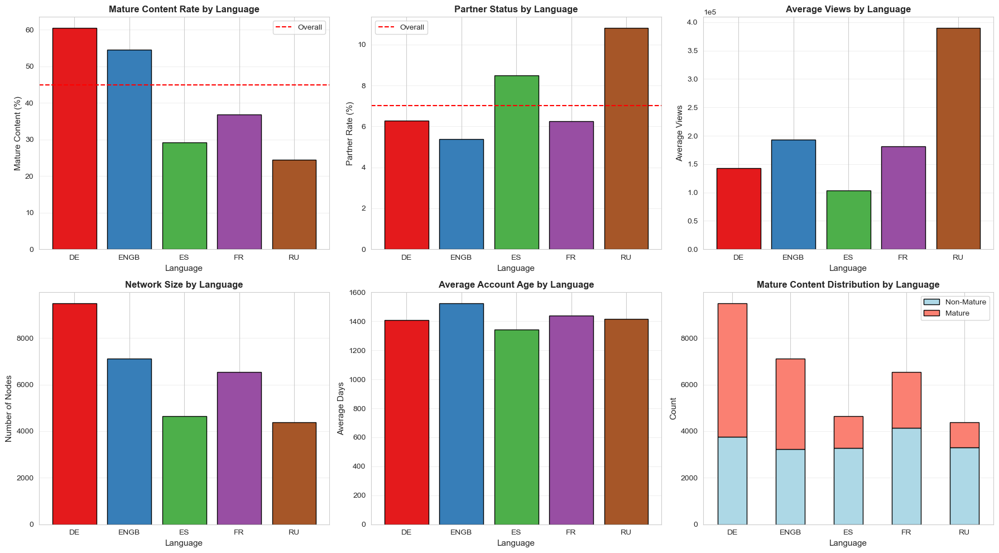


NODE ATTRIBUTES SUMMARY BY LANGUAGE
          Avg Days  Avg Views Mature % Partner %
language                                        
DE          1409.9   143152.0    60.5%      6.3%
ENGB        1525.2   193470.2    54.6%      5.4%
ES          1341.6   103236.7    29.3%      8.5%
FR          1441.0   181460.3    36.9%      6.3%
RU          1416.0   389743.2    24.5%     10.8%


In [9]:
# Create visualizations for node attributes - comparing by language
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
lang_colors = {
    'DE': '#e41a1c',    # Red
    'ENGB': '#377eb8',  # Blue
    'ES': '#4daf4a',    # Green
    'FR': '#984ea3',    # Purple
    'PTBR': '#ff7f00',  # Orange
    'RU': '#a65628'     # Brown
}

# 1. Mature content by language
mature_by_lang = target_df.groupby('language')['mature'].mean() * 100
axes[0, 0].bar(mature_by_lang.index, mature_by_lang.values, 
               color=[lang_colors[l] for l in mature_by_lang.index], edgecolor='black')
axes[0, 0].set_xlabel('Language', fontsize=11)
axes[0, 0].set_ylabel('Mature Content (%)', fontsize=11)
axes[0, 0].set_title('Mature Content Rate by Language', fontsize=12, fontweight='bold')
axes[0, 0].axhline(y=target_df['mature'].mean()*100, color='red', linestyle='--', label='Overall')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3, axis='y')

# 2. Partner status by language
partner_by_lang = target_df.groupby('language')['partner'].mean() * 100
axes[0, 1].bar(partner_by_lang.index, partner_by_lang.values, 
               color=[lang_colors[l] for l in partner_by_lang.index], edgecolor='black')
axes[0, 1].set_xlabel('Language', fontsize=11)
axes[0, 1].set_ylabel('Partner Rate (%)', fontsize=11)
axes[0, 1].set_title('Partner Status by Language', fontsize=12, fontweight='bold')
axes[0, 1].axhline(y=target_df['partner'].mean()*100, color='red', linestyle='--', label='Overall')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 3. Average views by language
views_by_lang = target_df.groupby('language')['views'].mean()
axes[0, 2].bar(views_by_lang.index, views_by_lang.values, 
               color=[lang_colors[l] for l in views_by_lang.index], edgecolor='black')
axes[0, 2].set_xlabel('Language', fontsize=11)
axes[0, 2].set_ylabel('Average Views', fontsize=11)
axes[0, 2].set_title('Average Views by Language', fontsize=12, fontweight='bold')
axes[0, 2].ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
axes[0, 2].grid(True, alpha=0.3, axis='y')

# 4. Network size comparison
node_counts = target_df.groupby('language').size()
axes[1, 0].bar(node_counts.index, node_counts.values, 
               color=[lang_colors[l] for l in node_counts.index], edgecolor='black')
axes[1, 0].set_xlabel('Language', fontsize=11)
axes[1, 0].set_ylabel('Number of Nodes', fontsize=11)
axes[1, 0].set_title('Network Size by Language', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# 5. Average days by language
days_by_lang = target_df.groupby('language')['days'].mean()
axes[1, 1].bar(days_by_lang.index, days_by_lang.values, 
               color=[lang_colors[l] for l in days_by_lang.index], edgecolor='black')
axes[1, 1].set_xlabel('Language', fontsize=11)
axes[1, 1].set_ylabel('Average Days', fontsize=11)
axes[1, 1].set_title('Average Account Age by Language', fontsize=12, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='y')

# 6. Stacked bar: Mature vs Non-Mature by language
mature_counts_by_lang = target_df.groupby(['language', 'mature']).size().unstack(fill_value=0)
mature_counts_by_lang.plot(kind='bar', stacked=True, ax=axes[1, 2], 
                            color=['lightblue', 'salmon'], edgecolor='black')
axes[1, 2].set_xlabel('Language', fontsize=11)
axes[1, 2].set_ylabel('Count', fontsize=11)
axes[1, 2].set_title('Mature Content Distribution by Language', fontsize=12, fontweight='bold')
axes[1, 2].legend(['Non-Mature', 'Mature'], loc='upper right')
axes[1, 2].tick_params(axis='x', rotation=0)
axes[1, 2].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('node_attributes_by_language.png', dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics by language
print("\n" + "="*70)
print("NODE ATTRIBUTES SUMMARY BY LANGUAGE")
print("="*70)
summary = target_df.groupby('language').agg({
    'days': 'mean',
    'views': 'mean',
    'mature': lambda x: f"{x.mean()*100:.1f}%",
    'partner': lambda x: f"{x.mean()*100:.1f}%"
}).round(1)
summary.columns = ['Avg Days', 'Avg Views', 'Mature %', 'Partner %']
print(summary)

In [11]:
# =============================================================================
# CENTRALITY MEASURES - COMPUTED PER LANGUAGE NETWORK
# =============================================================================
# Since languages are disconnected, we compute centrality WITHIN each language
# This gives meaningful results (e.g., betweenness within a community)

print("="*70)
print("COMPUTING CENTRALITY MEASURES (PER LANGUAGE)")
print("="*70)
print("""
Since the language networks are disconnected (no cross-language edges):
- Betweenness: A node can only be "between" nodes in its own language
- Closeness: Distance to other languages is infinite
- Computing per-language gives meaningful, comparable results
""")

# Store centrality results for all nodes
all_centrality_data = []

for lang in languages:
    print(f"\nComputing centrality for {lang}...")
    
    # Get subgraph for this language
    lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
    G_lang = G.subgraph(lang_nodes).copy()
    
    print(f"   Network size: {G_lang.number_of_nodes()} nodes, {G_lang.number_of_edges()} edges")
    
    # 1. Degree Centrality (normalized within language)
    degree_cent = nx.degree_centrality(G_lang)
    
    # 2. Betweenness Centrality (sampled for large networks)
    k_sample = min(500, G_lang.number_of_nodes())
    betweenness_cent = nx.betweenness_centrality(G_lang, k=k_sample)
    
    # 3. Closeness Centrality (meaningful within connected component)
    closeness_cent = nx.closeness_centrality(G_lang)
    
    # 4. Eigenvector Centrality
    try:
        eigenvector_cent = nx.eigenvector_centrality(G_lang, max_iter=1000)
    except:
        eigenvector_cent = nx.eigenvector_centrality_numpy(G_lang)
    
    # 5. PageRank
    pagerank_cent = nx.pagerank(G_lang)
    
    # Store results for each node
    for node in G_lang.nodes():
        node_data = {
            'node': node,
            'language': lang,
            'degree_centrality': degree_cent[node],
            'betweenness_centrality': betweenness_cent[node],
            'closeness_centrality': closeness_cent[node],
            'eigenvector_centrality': eigenvector_cent[node],
            'pagerank': pagerank_cent[node],
            'views': G.nodes[node].get('views', 0),
            'mature': G.nodes[node].get('mature', False),
            'partner': G.nodes[node].get('partner', False),
            'days': G.nodes[node].get('days', 0)
        }
        all_centrality_data.append(node_data)
    
    print(f"   Done!")

# Create DataFrame with all centrality data
centrality_df = pd.DataFrame(all_centrality_data)

print("\n" + "="*70)
print("CENTRALITY COMPUTATION COMPLETE")
print("="*70)
print(f"Total nodes processed: {len(centrality_df)}")
print(f"\nCentrality DataFrame preview:")
print(centrality_df.head(10))


COMPUTING CENTRALITY MEASURES (PER LANGUAGE)

Since the language networks are disconnected (no cross-language edges):
- Betweenness: A node can only be "between" nodes in its own language
- Closeness: Distance to other languages is infinite
- Computing per-language gives meaningful, comparable results


Computing centrality for DE...
   Network size: 9498 nodes, 153138 edges
   Done!

Computing centrality for ENGB...
   Network size: 7126 nodes, 35324 edges
   Done!

Computing centrality for ES...
   Network size: 4648 nodes, 59382 edges
   Done!

Computing centrality for FR...
   Network size: 6549 nodes, 112666 edges
   Done!

Computing centrality for RU...
   Network size: 4385 nodes, 37304 edges
   Done!

CENTRALITY COMPUTATION COMPLETE
Total nodes processed: 32206

Centrality DataFrame preview:
   node language  degree_centrality  betweenness_centrality  \
0     0       DE           0.000737            2.300361e-07   
1     1       DE           0.003475            1.624732e-04   


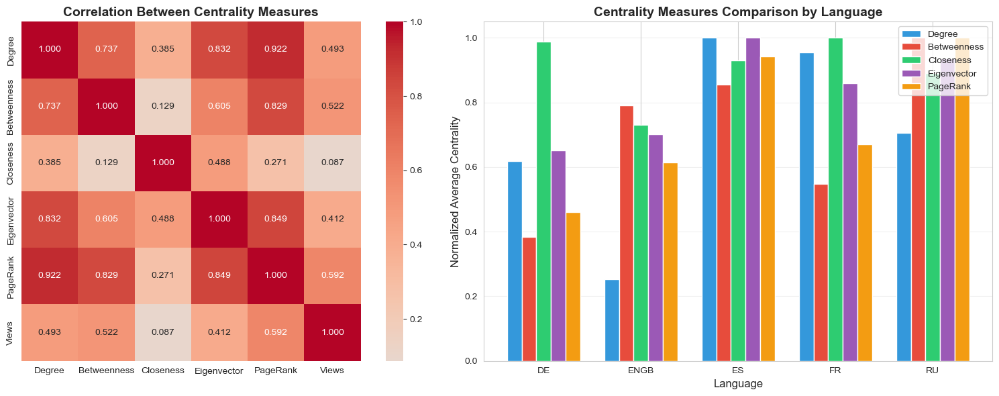


KEY CENTRALITY INSIGHTS

📊 Correlation Analysis:
  • Degree ↔ Eigenvector: 0.832 (typically high)
  • Degree ↔ PageRank: 0.922
  • Degree ↔ Views: 0.493
  • PageRank ↔ Views: 0.592

🌐 Top language by each centrality:
  • Degree Centrality: ES
  • Betweenness Centrality: RU
  • Closeness Centrality: FR
  • Eigenvector Centrality: ES
  • Pagerank: RU


In [15]:
# =============================================================================
# CENTRALITY CORRELATION ANALYSIS
# =============================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 1. Correlation Heatmap for all centrality measures
centrality_cols = ['degree_centrality', 'betweenness_centrality', 'closeness_centrality', 
                   'eigenvector_centrality', 'pagerank', 'views']
corr_matrix = centrality_df[centrality_cols].corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            ax=axes[0], fmt='.3f', square=True, 
            xticklabels=['Degree', 'Betweenness', 'Closeness', 'Eigenvector', 'PageRank', 'Views'],
            yticklabels=['Degree', 'Betweenness', 'Closeness', 'Eigenvector', 'PageRank', 'Views'])
axes[0].set_title('Correlation Between Centrality Measures', fontsize=14, fontweight='bold')

# 2. Average of all centrality measures by language (normalized bar chart)
avg_by_lang = centrality_df.groupby('language')[
    ['degree_centrality', 'betweenness_centrality', 'closeness_centrality', 
     'eigenvector_centrality', 'pagerank']
].mean()

# Normalize for comparison (divide by max)
avg_normalized = avg_by_lang / avg_by_lang.max()

x = np.arange(len(languages))
width = 0.15

bars1 = axes[1].bar(x - 2*width, avg_normalized['degree_centrality'], width, label='Degree', color='#3498db')
bars2 = axes[1].bar(x - width, avg_normalized['betweenness_centrality'], width, label='Betweenness', color='#e74c3c')
bars3 = axes[1].bar(x, avg_normalized['closeness_centrality'], width, label='Closeness', color='#2ecc71')
bars4 = axes[1].bar(x + width, avg_normalized['eigenvector_centrality'], width, label='Eigenvector', color='#9b59b6')
bars5 = axes[1].bar(x + 2*width, avg_normalized['pagerank'], width, label='PageRank', color='#f39c12')

axes[1].set_xlabel('Language', fontsize=12)
axes[1].set_ylabel('Normalized Average Centrality', fontsize=12)
axes[1].set_title('Centrality Measures Comparison by Language', fontsize=14, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(avg_normalized.index)
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('centrality_correlation_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Print key insights
print("\n" + "="*70)
print("KEY CENTRALITY INSIGHTS")
print("="*70)
print("\n📊 Correlation Analysis:")
print(f"  • Degree ↔ Eigenvector: {corr_matrix.loc['degree_centrality', 'eigenvector_centrality']:.3f} (typically high)")
print(f"  • Degree ↔ PageRank: {corr_matrix.loc['degree_centrality', 'pagerank']:.3f}")
print(f"  • Degree ↔ Views: {corr_matrix.loc['degree_centrality', 'views']:.3f}")
print(f"  • PageRank ↔ Views: {corr_matrix.loc['pagerank', 'views']:.3f}")

print("\n🌐 Top language by each centrality:")
for col in ['degree_centrality', 'betweenness_centrality', 'closeness_centrality', 
            'eigenvector_centrality', 'pagerank']:
    top_lang = avg_by_lang[col].idxmax()
    print(f"  • {col.replace('_', ' ').title()}: {top_lang}")


CREATING CENTRALITY COMPARISON VISUALIZATION FOR ENGB
Showing how the SAME network looks different under different centrality measures
Color scale: Purple (low) → Blue → Green → Yellow → Orange → Red (high)

📊 Processing Degree centrality...
   Top node: 11271, Subgraph: 250 nodes, 791 edges
📊 Processing Betweenness centrality...
   Top node: 11271, Subgraph: 250 nodes, 745 edges
📊 Processing Closeness centrality...
   Top node: 14447, Subgraph: 250 nodes, 1108 edges
📊 Processing Eigenvector centrality...
   Top node: 14447, Subgraph: 250 nodes, 1162 edges
📊 Processing PageRank centrality...
   Top node: 11271, Subgraph: 250 nodes, 788 edges


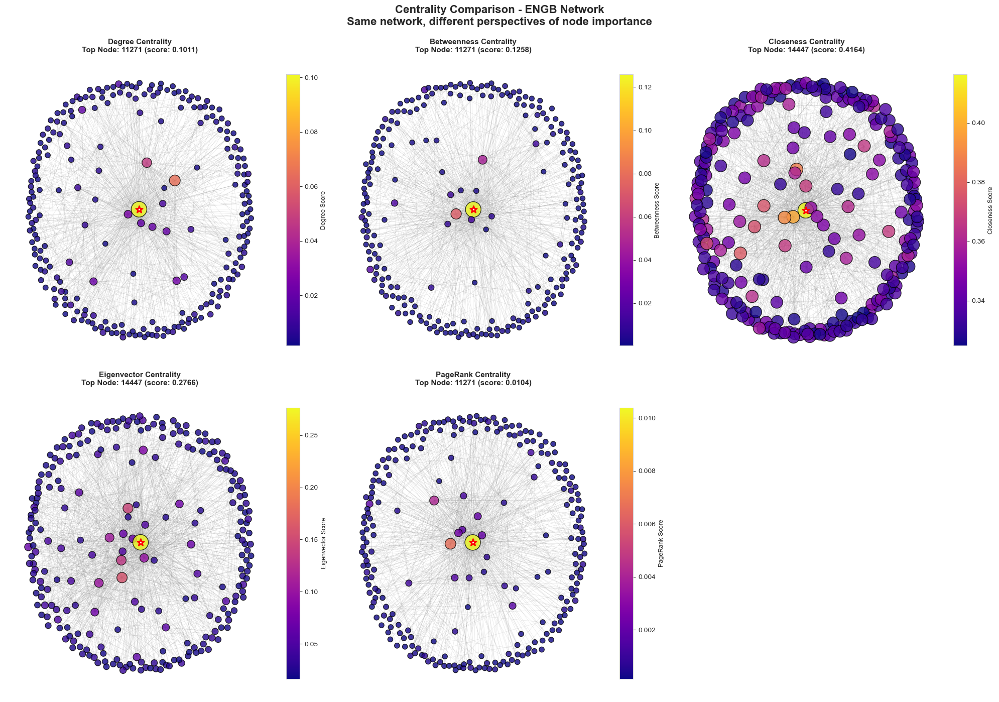


✅ Visualization saved to 'centrality_comparison_ENGB.png'

💡 Notice how:
  • The same nodes may have different colors across measures
  • The 'star' marks the most central node for each measure
  • Red nodes = high centrality, Purple nodes = low centrality


In [16]:
# =============================================================================
# NETWORK VISUALIZATION BY CENTRALITY MEASURE
# =============================================================================
# For each language, visualize the network centered on the highest centrality node
# Color nodes by centrality score: purple (low) → red (high)

import matplotlib.cm as cm
from matplotlib.colors import Normalize

def create_centrality_subgraph(G_lang, centrality_dict, top_node, k_neighbors=2, max_nodes=300):
    """
    Create a subgraph centered on the top node and its k-hop neighbors
    Limited to max_nodes for visualization clarity
    """
    # Start with the top node
    nodes_to_include = {top_node}
    
    # Add k-hop neighbors
    for k in range(k_neighbors):
        new_neighbors = set()
        for node in nodes_to_include:
            neighbors = set(G_lang.neighbors(node))
            new_neighbors.update(neighbors)
        nodes_to_include.update(new_neighbors)
        
        if len(nodes_to_include) > max_nodes:
            # Sort by centrality and keep top max_nodes
            sorted_nodes = sorted(nodes_to_include, 
                                 key=lambda n: centrality_dict.get(n, 0), 
                                 reverse=True)[:max_nodes]
            nodes_to_include = set(sorted_nodes)
            break
    
    return G_lang.subgraph(nodes_to_include).copy()


# Choose one representative language for detailed visualization (you can change this)
demo_language = 'ENGB'  # Change to 'DE', 'ES', 'FR', 'PTBR', or 'RU' if desired

print("="*70)
print(f"CREATING CENTRALITY COMPARISON VISUALIZATION FOR {demo_language}")
print("="*70)
print("Showing how the SAME network looks different under different centrality measures")
print("Color scale: Purple (low) → Blue → Green → Yellow → Orange → Red (high)\n")

# Get the language subgraph
lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == demo_language]
G_lang = G.subgraph(lang_nodes).copy()

# Get centrality data for this language
lang_centrality = centrality_df[centrality_df['language'] == demo_language]

# Define centrality measures to visualize
centrality_measures = {
    'Degree': 'degree_centrality',
    'Betweenness': 'betweenness_centrality',
    'Closeness': 'closeness_centrality',
    'Eigenvector': 'eigenvector_centrality',
    'PageRank': 'pagerank'
}

# Create figure with subplots (5 centrality measures)
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

# Color map: purple → blue → green → yellow → orange → red
cmap = cm.get_cmap('plasma')  # plasma: purple → pink → orange → yellow

for idx, (measure_name, measure_col) in enumerate(centrality_measures.items()):
    ax = axes[idx]
    
    print(f"📊 Processing {measure_name} centrality...")
    
    # Create dictionary of centrality values
    cent_dict = dict(zip(lang_centrality['node'], lang_centrality[measure_col]))
    
    # Find top node for this measure
    top_node = lang_centrality.loc[lang_centrality[measure_col].idxmax(), 'node']
    
    # Create subgraph centered on top node
    G_sub = create_centrality_subgraph(G_lang, cent_dict, top_node, k_neighbors=2, max_nodes=250)
    
    print(f"   Top node: {int(top_node)}, Subgraph: {G_sub.number_of_nodes()} nodes, {G_sub.number_of_edges()} edges")
    
    # Get centrality values for nodes in subgraph
    node_centralities = [cent_dict.get(n, 0) for n in G_sub.nodes()]
    
    # Normalize colors
    norm = Normalize(vmin=min(node_centralities), vmax=max(node_centralities))
    node_colors = [cmap(norm(c)) for c in node_centralities]
    
    # Node sizes: larger for higher centrality
    node_sizes = [50 + 300 * cent_dict.get(n, 0) / max(node_centralities) for n in G_sub.nodes()]
    
    # Make the top node stand out
    for i, node in enumerate(G_sub.nodes()):
        if node == top_node:
            node_sizes[i] = 500
            break
    
    # Layout
    pos = nx.spring_layout(G_sub, k=1.5, iterations=50, seed=42)
    
    # Draw network
    nx.draw_networkx_edges(G_sub, pos, alpha=0.2, edge_color='gray', width=0.5, ax=ax)
    nx.draw_networkx_nodes(G_sub, pos, node_color=node_colors, node_size=node_sizes, 
                           alpha=0.8, ax=ax, edgecolors='black', linewidths=1)
    
    # Highlight top node with a star
    top_pos = {top_node: pos[top_node]}
    nx.draw_networkx_nodes(top_pos, pos, node_color='white', node_size=100, 
                           node_shape='*', ax=ax, edgecolors='red', linewidths=2)
    
    # Add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(f'{measure_name} Score', fontsize=9)
    
    # Title
    top_cent_value = cent_dict.get(top_node, 0)
    ax.set_title(f'{measure_name} Centrality\nTop Node: {int(top_node)} (score: {top_cent_value:.4f})', 
                 fontsize=11, fontweight='bold')
    ax.axis('off')

# Remove extra subplot
axes[5].axis('off')

plt.suptitle(f'Centrality Comparison - {demo_language} Network\n' + 
             'Same network, different perspectives of node importance', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(f'centrality_comparison_{demo_language}.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Visualization saved to 'centrality_comparison_{demo_language}.png'")
print("\n💡 Notice how:")
print("  • The same nodes may have different colors across measures")
print("  • The 'star' marks the most central node for each measure")
print("  • Red nodes = high centrality, Purple nodes = low centrality")


CREATING CENTRALITY VISUALIZATIONS FOR ALL LANGUAGES
Generating 5 figures (one per centrality measure)
Each figure shows all 6 language networks

  • The 'star' marks the most central node for each measure
  • Red nodes = high centrality, Purple nodes = low centrality

Creating Degree centrality comparison...


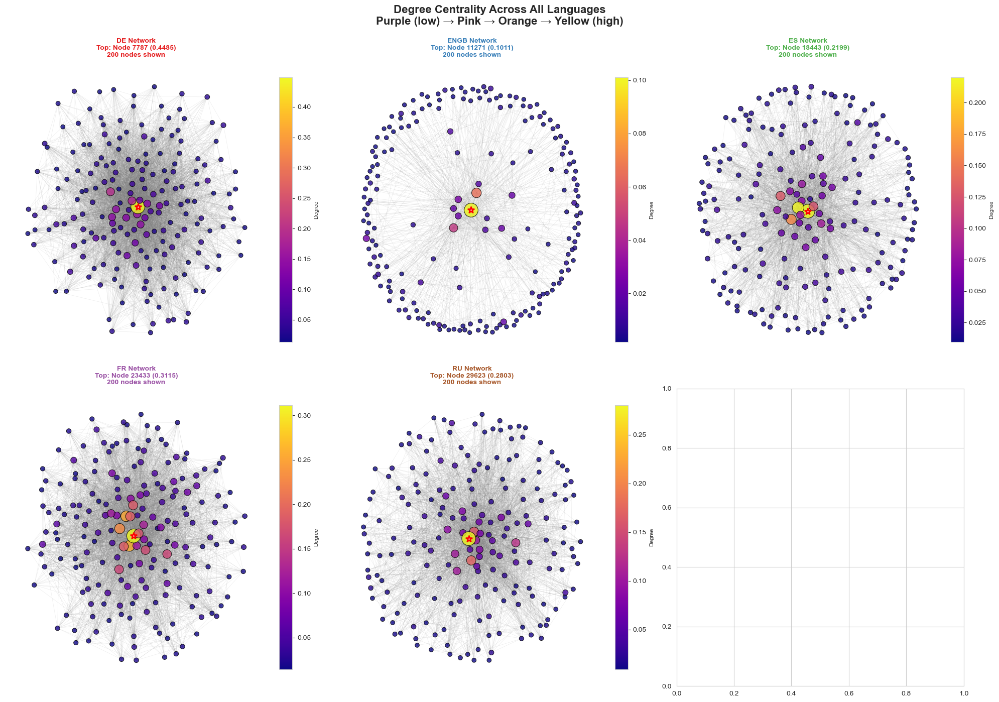

   Saved: centrality_degree_centrality_all_languages.png

Creating Betweenness centrality comparison...


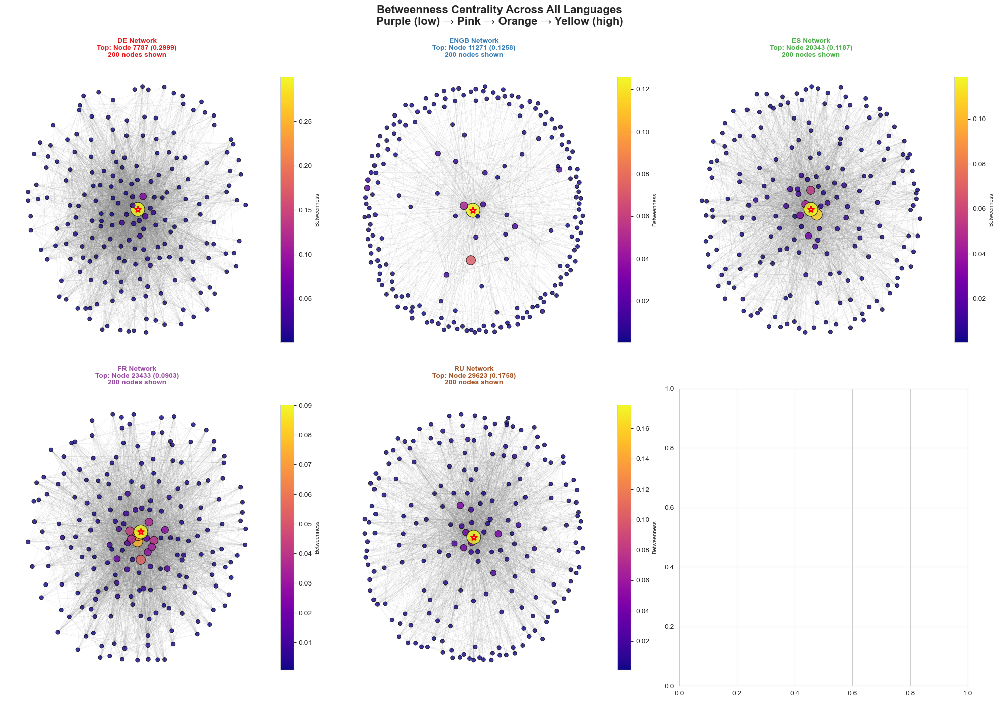

   Saved: centrality_betweenness_centrality_all_languages.png

Creating Closeness centrality comparison...


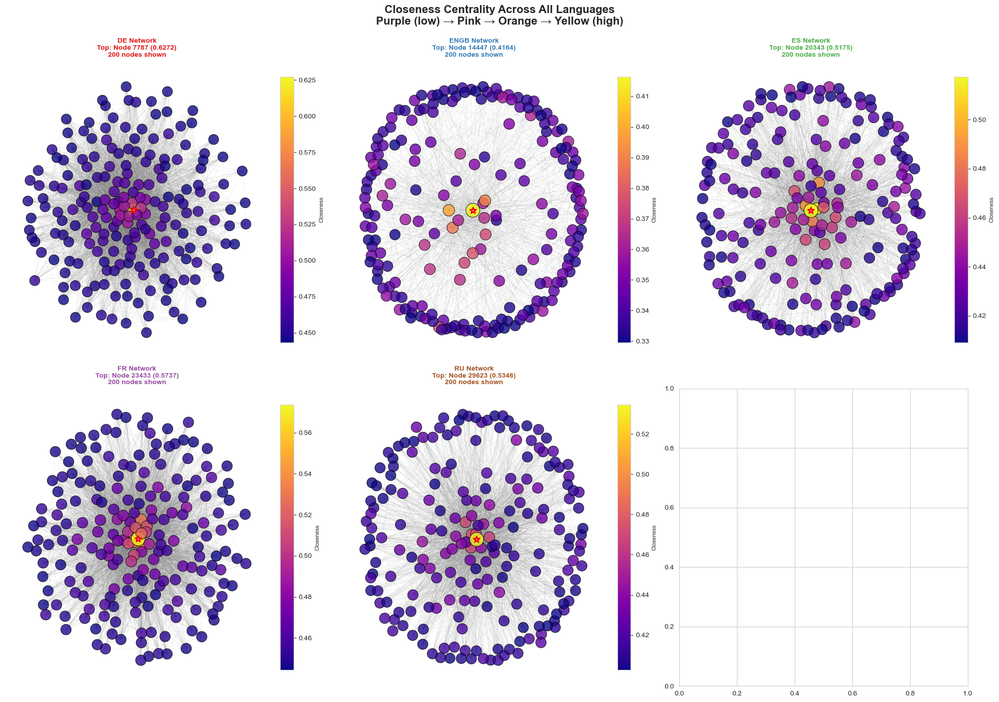

   Saved: centrality_closeness_centrality_all_languages.png

Creating Eigenvector centrality comparison...


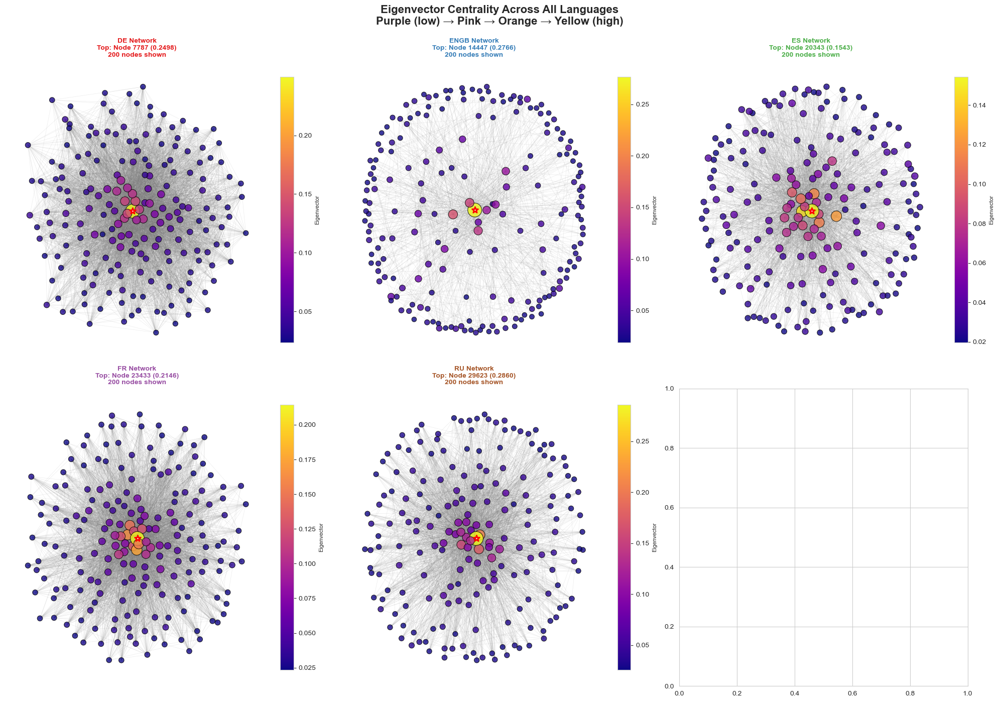

   Saved: centrality_eigenvector_centrality_all_languages.png

Creating PageRank centrality comparison...


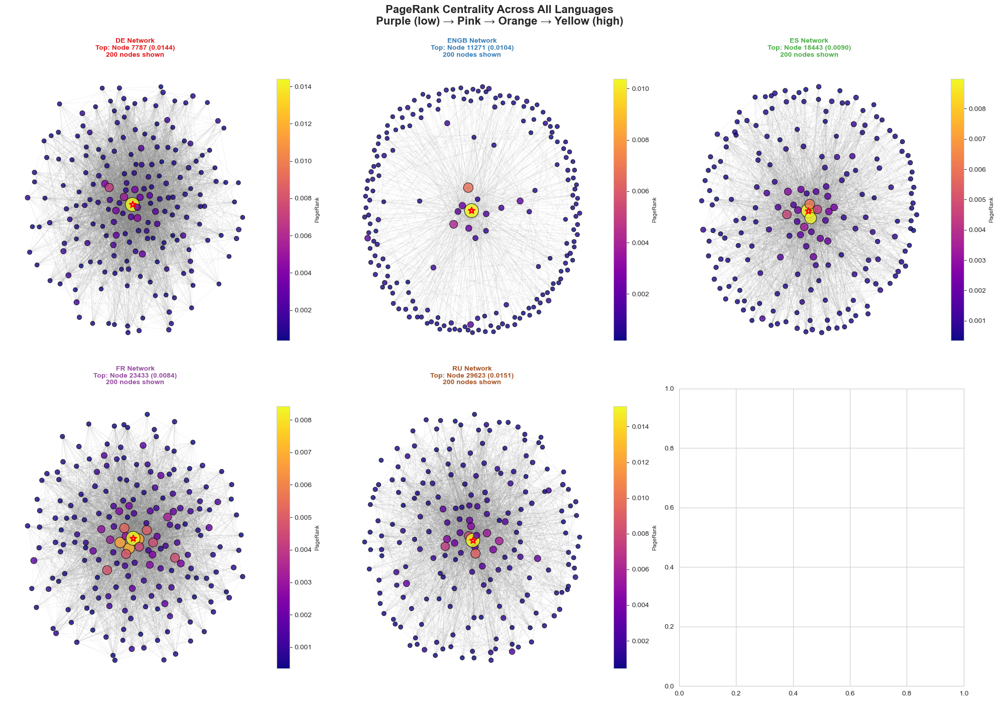

   Saved: centrality_pagerank_all_languages.png

ALL VISUALIZATIONS COMPLETE!
Files generated:
   • centrality_comparison_ENGB.png (detailed view of one language)
   • centrality_degree_centrality_all_languages.png
   • centrality_betweenness_centrality_all_languages.png
   • centrality_closeness_centrality_all_languages.png
   • centrality_eigenvector_centrality_all_languages.png
   • centrality_pagerank_all_languages.png
Key insights:
   • Different nodes become 'important' under different centrality measures
   • The SAME node can be red (important) in one measure, purple (unimportant) in another
   • Languages have different network structures (visible in the patterns)


In [17]:
# =============================================================================
# MULTI-LANGUAGE CENTRALITY COMPARISON (ALL LANGUAGES)
# =============================================================================
# Create separate figures for each centrality measure showing all languages

print("="*70)
print("CREATING CENTRALITY VISUALIZATIONS FOR ALL LANGUAGES")
print("="*70)
print("Generating 5 figures (one per centrality measure)")
print("Each figure shows all 6 language networks\n")
print("  • The 'star' marks the most central node for each measure")
print("  • Red nodes = high centrality, Purple nodes = low centrality")
# Define centrality measures
centrality_measures = {
    'Degree': 'degree_centrality',
    'Betweenness': 'betweenness_centrality',
    'Closeness': 'closeness_centrality',
    'Eigenvector': 'eigenvector_centrality',
    'PageRank': 'pagerank'
}

cmap = cm.get_cmap('plasma')

for measure_name, measure_col in centrality_measures.items():
    print(f"\nCreating {measure_name} centrality comparison...")
    
    # Create figure for this centrality measure (2x3 grid for all languages)
    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    axes = axes.flatten()
    
    for lang_idx, lang in enumerate(languages):
        ax = axes[lang_idx]
        
        # Get language subgraph
        lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
        G_lang = G.subgraph(lang_nodes).copy()
        
        # Get centrality data
        lang_centrality = centrality_df[centrality_df['language'] == lang]
        cent_dict = dict(zip(lang_centrality['node'], lang_centrality[measure_col]))
        
        # Find top node
        top_node = lang_centrality.loc[lang_centrality[measure_col].idxmax(), 'node']
        
        # Create subgraph (smaller for better performance)
        max_nodes = 200 if G_lang.number_of_nodes() > 2000 else 150
        G_sub = create_centrality_subgraph(G_lang, cent_dict, top_node, 
                                          k_neighbors=2, max_nodes=max_nodes)
        
        # Get centrality values for nodes in subgraph
        node_centralities = [cent_dict.get(n, 0) for n in G_sub.nodes()]
        
        # Normalize colors
        norm = Normalize(vmin=min(node_centralities), vmax=max(node_centralities))
        node_colors = [cmap(norm(c)) for c in node_centralities]
        
        # Node sizes
        node_sizes = [30 + 250 * cent_dict.get(n, 0) / max(node_centralities) for n in G_sub.nodes()]
        
        # Highlight top node
        for i, node in enumerate(G_sub.nodes()):
            if node == top_node:
                node_sizes[i] = 400
                break
        
        # Layout
        pos = nx.spring_layout(G_sub, k=1.5, iterations=50, seed=42)
        
        # Draw
        nx.draw_networkx_edges(G_sub, pos, alpha=0.15, edge_color='gray', width=0.5, ax=ax)
        nx.draw_networkx_nodes(G_sub, pos, node_color=node_colors, node_size=node_sizes, 
                               alpha=0.8, ax=ax, edgecolors='black', linewidths=0.8)
        
        # Star marker for top node
        top_pos = {top_node: pos[top_node]}
        nx.draw_networkx_nodes(top_pos, pos, node_color='white', node_size=80, 
                               node_shape='*', ax=ax, edgecolors='red', linewidths=2)
        
        # Colorbar
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label(f'{measure_name}', fontsize=8)
        
        # Title
        top_cent_value = cent_dict.get(top_node, 0)
        ax.set_title(f'{lang} Network\nTop: Node {int(top_node)} ({top_cent_value:.4f})\n' + 
                     f'{G_sub.number_of_nodes()} nodes shown', 
                     fontsize=10, fontweight='bold', color=lang_colors[lang])
        ax.axis('off')
    
    plt.suptitle(f'{measure_name} Centrality Across All Languages\n' + 
                 'Purple (low) → Pink → Orange → Yellow (high)', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(f'centrality_{measure_col}_all_languages.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   Saved: centrality_{measure_col}_all_languages.png")

print("\n" + "="*70)
print("ALL VISUALIZATIONS COMPLETE!")
print("="*70)
print("Files generated:")
print("   • centrality_comparison_ENGB.png (detailed view of one language)")
print("   • centrality_degree_centrality_all_languages.png")
print("   • centrality_betweenness_centrality_all_languages.png")
print("   • centrality_closeness_centrality_all_languages.png")
print("   • centrality_eigenvector_centrality_all_languages.png")
print("   • centrality_pagerank_all_languages.png")
print("Key insights:")
print("   • Different nodes become 'important' under different centrality measures")
print("   • The SAME node can be red (important) in one measure, purple (unimportant) in another")
print("   • Languages have different network structures (visible in the patterns)")


In [ ]:
# =============================================================================
# COMMUNITY DETECTION - PER LANGUAGE NETWORK
# =============================================================================
# Apply multiple community detection algorithms to each language network separately


print("="*70)
print("COMMUNITY DETECTION - PER LANGUAGE ANALYSIS")
print("="*70)
print("""
Applying community detection algorithms to each language network:
1. Louvain Method - Fast modularity optimization
2. Label Propagation - Simple, semi-supervised approach  

Why per-language?
- Each language network is disconnected from others
- Allows fair comparison of community structures across languages
""")

# Store results for all languages
community_results = {
    'louvain': {},
    'label_propagation': {},
    'greedy_modularity': {}
}

for lang in languages:
    print(f"\n{'='*70}")
    print(f"PROCESSING {lang} NETWORK")
    print(f"{'='*70}")
    
    # Get language subgraph
    lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
    G_lang = G.subgraph(lang_nodes).copy()
    
    print(f"Network size: {G_lang.number_of_nodes()} nodes, {G_lang.number_of_edges()} edges")
    
    # -------------------------
    # 1. LOUVAIN METHOD
    # -------------------------
    print(f"\nApplying Louvain...")
    louvain_partition = community_louvain.best_partition(G_lang, random_state=42)
    louvain_modularity = community_louvain.modularity(louvain_partition, G_lang)
    
    # Convert to community sets
    louvain_communities = {}
    for node, comm_id in louvain_partition.items():
        if comm_id not in louvain_communities:
            louvain_communities[comm_id] = set()
        louvain_communities[comm_id].add(node)
    
    louvain_sets = list(louvain_communities.values())
    
    print(f"   Communities found: {len(louvain_sets)}")
    print(f"   Modularity: {louvain_modularity:.4f}")
    
    # -------------------------
    # 2. LABEL PROPAGATION
    # -------------------------
    print(f"\nApplying Label Propagation...")
    
    # Run multiple times and take best (it's non-deterministic)
    best_lp_modularity = -1
    best_lp_communities = None
    
    for seed in range(5):
        lp_communities_gen = nx_community.label_propagation_communities(G_lang)
        lp_communities_list = list(lp_communities_gen)
        
        # Convert to partition for modularity calculation
        lp_partition = {}
        for comm_id, comm_nodes in enumerate(lp_communities_list):
            for node in comm_nodes:
                lp_partition[node] = comm_id
        
        mod = community_louvain.modularity(lp_partition, G_lang)
        if mod > best_lp_modularity:
            best_lp_modularity = mod
            best_lp_communities = lp_communities_list
    
    print(f"   Communities found: {len(best_lp_communities)}")
    print(f"   Modularity: {best_lp_modularity:.4f}")
    
    # Store results
    community_results['louvain'][lang] = {
        'partition': louvain_partition,
        'communities': louvain_sets,
        'modularity': louvain_modularity,
        'num_communities': len(louvain_sets)
    }
    
    community_results['label_propagation'][lang] = {
        'communities': best_lp_communities,
        'modularity': best_lp_modularity,
        'num_communities': len(best_lp_communities)
    }

print("\n" + "="*70)
print("COMMUNITY DETECTION COMPLETE FOR ALL LANGUAGES")
print("="*70)


python-louvain already installed
COMMUNITY DETECTION - PER LANGUAGE ANALYSIS

Applying community detection algorithms to each language network:
1. Louvain Method - Fast modularity optimization
2. Label Propagation - Simple, semi-supervised approach  

Why per-language?
- Each language network is disconnected from others
- Allows fair comparison of community structures across languages


PROCESSING DE NETWORK
Network size: 9498 nodes, 153138 edges

Applying Louvain...
   Communities found: 12
   Modularity: 0.2835

Applying Label Propagation...
   Communities found: 15
   Modularity: 0.0002

PROCESSING ENGB NETWORK
Network size: 7126 nodes, 35324 edges

Applying Louvain...
   Communities found: 20
   Modularity: 0.4508

Applying Label Propagation...
   Communities found: 200
   Modularity: 0.3728

PROCESSING ES NETWORK
Network size: 4648 nodes, 59382 edges

Applying Louvain...
   Communities found: 12
   Modularity: 0.4063

Applying Label Propagation...
   Communities found: 20
   Modul

In [31]:
def evaluate_community_quality(G_lang, communities_list, lang):
    """
    Calculate comprehensive quality metrics for a community structure
    """
    metrics = {}
    
    # 1. Number of communities
    metrics['num_communities'] = len(communities_list)
    
    # 2. Community size statistics
    sizes = [len(c) for c in communities_list]
    metrics['avg_size'] = np.mean(sizes)
    metrics['std_size'] = np.std(sizes)
    metrics['min_size'] = np.min(sizes)
    metrics['max_size'] = np.max(sizes)
    metrics['median_size'] = np.median(sizes)
    
    # 3. Coverage - fraction of edges within communities
    intra_edges = 0
    for comm in communities_list:
        subgraph = G_lang.subgraph(comm)
        intra_edges += subgraph.number_of_edges()
    metrics['coverage'] = intra_edges / G_lang.number_of_edges() if G_lang.number_of_edges() > 0 else 0
    
    # 4. Average internal density
    densities = []
    for comm in communities_list:
        if len(comm) > 1:
            subgraph = G_lang.subgraph(comm)
            density = nx.density(subgraph)
            densities.append(density)
    metrics['avg_internal_density'] = np.mean(densities) if densities else 0
    metrics['std_internal_density'] = np.std(densities) if densities else 0
    
    # 5. Average conductance (lower is better - measures cut size)
    # Manual calculation: conductance = cut_edges / min(vol_S, vol_complement)
    conductances = []
    for comm in communities_list:
        comm_set = set(comm)
        if len(comm_set) > 1 and len(comm_set) < G_lang.number_of_nodes():
            # Calculate cut edges (edges between community and rest of graph)
            cut_edges = 0
            vol_S = 0  # Volume of community (sum of degrees)
            
            for node in comm_set:
                node_degree = G_lang.degree(node)
                vol_S += node_degree
                # Count edges going outside the community
                for neighbor in G_lang.neighbors(node):
                    if neighbor not in comm_set:
                        cut_edges += 1
            
            # Volume of complement
            total_volume = sum(dict(G_lang.degree()).values())
            vol_complement = total_volume - vol_S
            
            # Conductance = cut / min(vol_S, vol_complement)
            min_vol = min(vol_S, vol_complement)
            if min_vol > 0:
                conductance = cut_edges / min_vol
                conductances.append(conductance)
    
    metrics['avg_conductance'] = np.mean(conductances) if conductances else 0
    
    # 6. Modularity (stored separately, just for confirmation)
    # Will be added from pre-computed values
    
    return metrics


In [ ]:
# =============================================================================
# COMMUNITY QUALITY EVALUATION
# =============================================================================
# Evaluate quality of detected communities using multiple metrics

print("="*70)
print("EVALUATING COMMUNITY QUALITY - ALL ALGORITHMS & LANGUAGES")
print("="*70)

# Evaluate all algorithms for all languages
quality_results = []

for algorithm in ['louvain', 'label_propagation']:
    for lang in languages:
        # Get language subgraph
        lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
        G_lang = G.subgraph(lang_nodes).copy()
        
        # Get communities
        communities = community_results[algorithm][lang]['communities']
        modularity = community_results[algorithm][lang]['modularity']
        
        # Evaluate quality
        metrics = evaluate_community_quality(G_lang, communities, lang)
        metrics['algorithm'] = algorithm
        metrics['language'] = lang
        metrics['modularity'] = modularity
        
        quality_results.append(metrics)

# Create DataFrame
quality_df = pd.DataFrame(quality_results)

# Display results
print("\n" + "="*70)
print("QUALITY METRICS BY ALGORITHM AND LANGUAGE")
print("="*70)
print("\nMetrics explained:")
print("  • Modularity: Higher is better (range: -0.5 to 1)")
print("  • Coverage: Higher is better (range: 0 to 1)")
print("  • Avg Internal Density: Higher is better")
print("  • Avg Conductance: Lower is better (measures separation)")
print("\n")

# Show pivot table for modularity
print("MODULARITY (Higher is better):")
modularity_pivot = quality_df.pivot(index='language', columns='algorithm', values='modularity')
print(modularity_pivot.round(4))

print("\n" + "-"*70)
print("COVERAGE (Fraction of edges within communities):")
coverage_pivot = quality_df.pivot(index='language', columns='algorithm', values='coverage')
print(coverage_pivot.round(4))

print("\n" + "-"*70)
print("NUMBER OF COMMUNITIES:")
num_comm_pivot = quality_df.pivot(index='language', columns='algorithm', values='num_communities')
print(num_comm_pivot.astype(int))

print("\n" + "-"*70)
print("AVERAGE INTERNAL DENSITY:")
density_pivot = quality_df.pivot(index='language', columns='algorithm', values='avg_internal_density')
print(density_pivot.round(4))

print("\n" + "-"*70)
print("AVERAGE CONDUCTANCE (Lower is better):")
conductance_pivot = quality_df.pivot(index='language', columns='algorithm', values='avg_conductance')
print(conductance_pivot.round(4))

# Find best algorithm per language based on modularity
print("\n" + "="*70)
print("BEST ALGORITHM BY LANGUAGE (based on Modularity)")
print("="*70)
for lang in languages:
    lang_data = quality_df[quality_df['language'] == lang]
    best_algo = lang_data.loc[lang_data['modularity'].idxmax(), 'algorithm']
    best_mod = lang_data['modularity'].max()
    print(f"  {lang}: {best_algo.upper()} (modularity: {best_mod:.4f})")


EVALUATING COMMUNITY QUALITY - ALL ALGORITHMS & LANGUAGES

QUALITY METRICS BY ALGORITHM AND LANGUAGE

Metrics explained:
  • Modularity: Higher is better (range: -0.5 to 1)
  • Coverage: Higher is better (range: 0 to 1)
  • Avg Internal Density: Higher is better
  • Avg Conductance: Lower is better (measures separation)


MODULARITY (Higher is better):
algorithm  label_propagation  louvain
language                             
DE                    0.0002   0.2835
ENGB                  0.3728   0.4508
ES                    0.3483   0.4063
FR                    0.0002   0.3422
RU                    0.0009   0.3359

----------------------------------------------------------------------
COVERAGE (Fraction of edges within communities):
algorithm  label_propagation  louvain
language                             
DE                    0.9999   0.5014
ENGB                  0.7682   0.5743
ES                    0.8659   0.6678
FR                    0.9999   0.5644
RU                    0.9996  

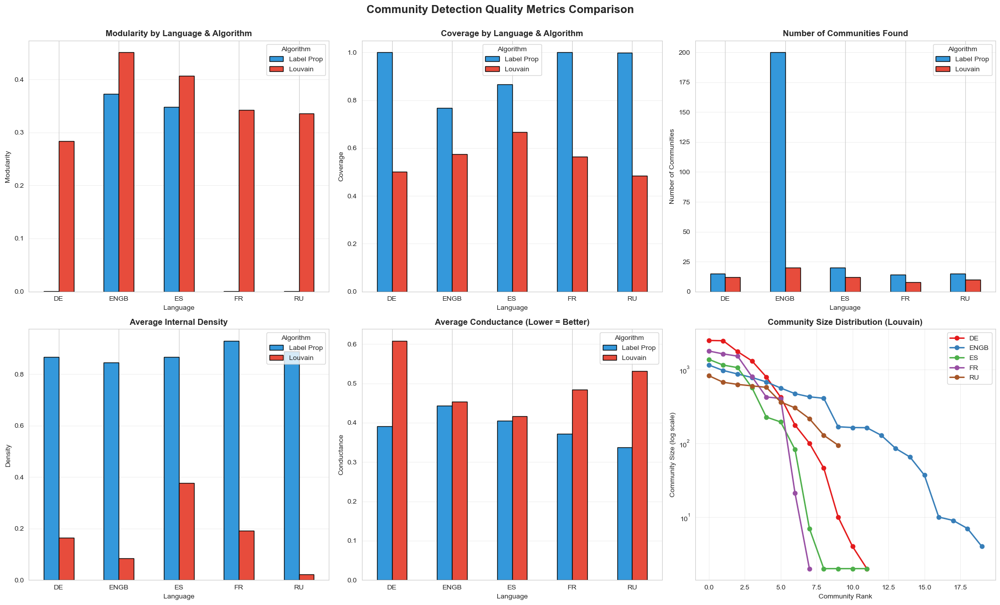

✅ Community quality visualization saved to 'community_quality_comparison.png'


In [20]:
# =============================================================================
# VISUALIZE COMMUNITY QUALITY METRICS
# =============================================================================

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Modularity Comparison
ax = axes[0, 0]
modularity_pivot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c'], edgecolor='black')
ax.set_title('Modularity by Language & Algorithm', fontsize=12, fontweight='bold')
ax.set_xlabel('Language')
ax.set_ylabel('Modularity')
ax.legend(title='Algorithm', labels=['Label Prop','Louvain'])
ax.grid(True, alpha=0.3, axis='y')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# 2. Coverage Comparison
ax = axes[0, 1]
coverage_pivot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black')
ax.set_title('Coverage by Language & Algorithm', fontsize=12, fontweight='bold')
ax.set_xlabel('Language')
ax.set_ylabel('Coverage')
ax.legend(title='Algorithm', labels=['Label Prop','Louvain'])
ax.grid(True, alpha=0.3, axis='y')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# 3. Number of Communities
ax = axes[0, 2]
num_comm_pivot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black')
ax.set_title('Number of Communities Found', fontsize=12, fontweight='bold')
ax.set_xlabel('Language')
ax.set_ylabel('Number of Communities')
ax.legend(title='Algorithm', labels=['Label Prop','Louvain'])
ax.grid(True, alpha=0.3, axis='y')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# 4. Internal Density
ax = axes[1, 0]
density_pivot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black')
ax.set_title('Average Internal Density', fontsize=12, fontweight='bold')
ax.set_xlabel('Language')
ax.set_ylabel('Density')
ax.legend(title='Algorithm', labels=['Label Prop','Louvain'])
ax.grid(True, alpha=0.3, axis='y')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# 5. Conductance
ax = axes[1, 1]
conductance_pivot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black')
ax.set_title('Average Conductance (Lower = Better)', fontsize=12, fontweight='bold')
ax.set_xlabel('Language')
ax.set_ylabel('Conductance')
ax.legend(title='Algorithm', labels=['Label Prop','Louvain'])
ax.grid(True, alpha=0.3, axis='y')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# 6. Community Size Distribution (Louvain only, all languages)
ax = axes[1, 2]
for lang in languages:
    communities = community_results['louvain'][lang]['communities']
    sizes = sorted([len(c) for c in communities], reverse=True)
    ax.plot(range(len(sizes)), sizes, marker='o', label=lang, color=lang_colors[lang], linewidth=2)

ax.set_title('Community Size Distribution (Louvain)', fontsize=12, fontweight='bold')
ax.set_xlabel('Community Rank')
ax.set_ylabel('Community Size (log scale)')
ax.set_yscale('log')
ax.legend()
ax.grid(True, alpha=0.3)

plt.suptitle('Community Detection Quality Metrics Comparison', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig('community_quality_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Community quality visualization saved to 'community_quality_comparison.png'")


VISUALIZING LOUVAIN COMMUNITIES FOR ALL LANGUAGES
Visualizing DE communities...
   Sampled to 2864 nodes for visualization
Visualizing ENGB communities...
   Sampled to 2110 nodes for visualization
Visualizing ES communities...
   Sampled to 1400 nodes for visualization
Visualizing FR communities...
   Sampled to 1976 nodes for visualization
Visualizing RU communities...
   Sampled to 1311 nodes for visualization


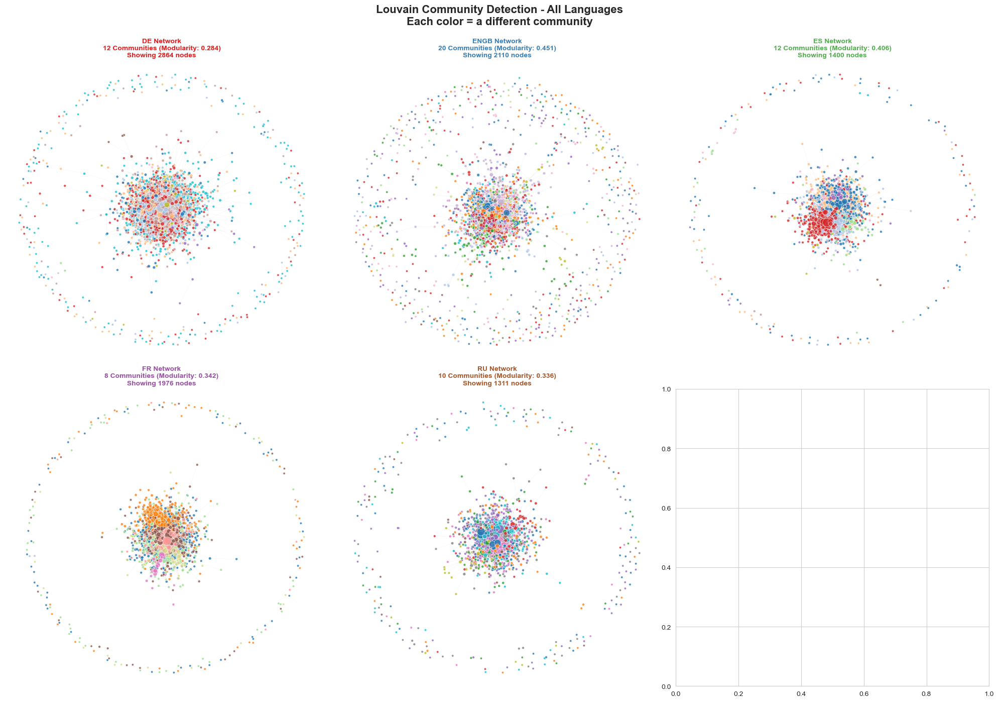


Community visualization saved to 'louvain_communities_all_languages.png'

Observations:
  • Each color represents a distinct community
  • Node size reflects degree (larger = more connections)
  • Dense clusters indicate well-defined communities
  • Modularity scores show community structure quality


In [22]:
# =============================================================================
# VISUALIZE DETECTED COMMUNITIES (LOUVAIN)
# =============================================================================

print("="*70)
print("VISUALIZING LOUVAIN COMMUNITIES FOR ALL LANGUAGES")
print("="*70)

fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

for lang_idx, lang in enumerate(languages):
    ax = axes[lang_idx]
    
    print(f"Visualizing {lang} communities...")
    
    # Get language subgraph
    lang_nodes = [n for n in G.nodes() if G.nodes[n].get('language') == lang]
    G_lang = G.subgraph(lang_nodes).copy()
    
    # Get Louvain partition
    louvain_partition = community_results['louvain'][lang]['partition']
    communities = community_results['louvain'][lang]['communities']
    
    # Sample nodes if network is too large
    if G_lang.number_of_nodes() > 1000:
        # Sample proportionally from each community
        sampled_nodes = set()
        sorted_comms = sorted(communities, key=len, reverse=True)[:15]  # Top 15 communities
        
        for comm in sorted_comms:
            # Sample from community (proportional to size, min 20 nodes)
            sample_size = min(len(comm), max(20, int(len(comm) * 0.3)))
            sampled = list(comm)[:sample_size]
            sampled_nodes.update(sampled)
        
        G_lang = G_lang.subgraph(sampled_nodes).copy()
        print(f"   Sampled to {G_lang.number_of_nodes()} nodes for visualization")
    
    # Assign colors to communities
    unique_communities = list(set(louvain_partition[n] for n in G_lang.nodes()))
    num_communities = len(unique_communities)
    
    # Use tab20 colormap for more distinct colors
    if num_communities <= 20:
        comm_cmap = plt.cm.tab20
    else:
        comm_cmap = plt.cm.hsv
    
    community_colors = {comm: comm_cmap(i / num_communities) 
                       for i, comm in enumerate(unique_communities)}
    
    node_colors = [community_colors[louvain_partition[n]] for n in G_lang.nodes()]
    
    # Node sizes based on degree
    node_sizes = [min(G_lang.degree(n) * 2 + 10, 150) for n in G_lang.nodes()]
    
    # Layout
    pos = nx.spring_layout(G_lang, k=1.0, iterations=50, seed=42)
    
    # Draw
    nx.draw_networkx_edges(G_lang, pos, alpha=0.1, edge_color='gray', width=0.3, ax=ax)
    nx.draw_networkx_nodes(G_lang, pos, node_color=node_colors, node_size=node_sizes, 
                           alpha=0.8, ax=ax, edgecolors='white', linewidths=0.5)
    
    # Title
    actual_num_comms = len(communities)
    modularity = community_results['louvain'][lang]['modularity']
    
    ax.set_title(f'{lang} Network\n{actual_num_comms} Communities (Modularity: {modularity:.3f})\n' +
                 f'Showing {G_lang.number_of_nodes()} nodes', 
                 fontsize=10, fontweight='bold', color=lang_colors[lang])
    ax.axis('off')

plt.suptitle('Louvain Community Detection - All Languages\nEach color = a different community', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('louvain_communities_all_languages.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nCommunity visualization saved to 'louvain_communities_all_languages.png'")
print("\nObservations:")
print("  • Each color represents a distinct community")
print("  • Node size reflects degree (larger = more connections)")
print("  • Dense clusters indicate well-defined communities")
print("  • Modularity scores show community structure quality")


## CORA Dataset

In [15]:
# =============================================================================
# LOAD CORA CITATIONS DATA
# =============================================================================

print("="*70)
print("LOADING CORA CITATIONS NETWORK")
print("="*70)

# Load citation edges
# Format: <cited_paper> <citing_paper> (edge direction: citing -> cited)
cora_edges_path = 'cora/cora.cites'
cora_content_path = 'cora/cora.content'

cora_edges = pd.read_csv(cora_edges_path, sep='\t', header=None, names=['cited', 'citing'])
print(f"\nLoaded {len(cora_edges):,} citation edges")

# Load node features and labels
# Format: <paper_id> <word_features (1433 binary)> <class_label>
cora_nodes = pd.read_csv(cora_content_path, sep='\t', header=None)

# Extract paper IDs (first column)
cora_node_ids = cora_nodes.iloc[:, 0].tolist()

# Extract class labels (last column)
cora_labels = cora_nodes.iloc[:, -1]

# Create label mapping (paper_id -> class_label)
cora_label_map = dict(zip(cora_node_ids, cora_labels))

# Get unique classes
cora_classes = sorted(cora_labels.unique())
print(f"Number of unique classes: {len(cora_classes)}")
print(f"Classes: {', '.join(cora_classes)}")

# Create numeric label codes for visualization
cora_label_codes = cora_labels.astype('category').cat.codes
cora_label_code_map = dict(zip(cora_node_ids, cora_label_codes))

# Create directed graph from edges
# Note: Edge (A, B) in file means A is cited by B, so edge direction is B -> A
# We'll create edges as (citing -> cited) for more intuitive interpretation
G_cora = nx.from_pandas_edgelist(cora_edges, source='citing', target='cited', create_using=nx.DiGraph())

print(f"\nGraph created:")
print(f"   Nodes: {G_cora.number_of_nodes():,}")
print(f"   Edges: {G_cora.number_of_edges():,}")
print(f"   Is Directed: {nx.is_directed(G_cora)}")

# Add node attributes
for node in G_cora.nodes():
    if node in cora_label_map:
        G_cora.nodes[node]['class_label'] = cora_label_map[node]
        G_cora.nodes[node]['class_code'] = cora_label_code_map[node]

print("\n✅ Cora data loaded successfully!")


LOADING CORA CITATIONS NETWORK

Loaded 5,429 citation edges
Number of unique classes: 7
Classes: Case_Based, Genetic_Algorithms, Neural_Networks, Probabilistic_Methods, Reinforcement_Learning, Rule_Learning, Theory

Graph created:
   Nodes: 2,708
   Edges: 5,429
   Is Directed: True

✅ Cora data loaded successfully!


In [ ]:
# =============================================================================
# BASIC NETWORK STATISTICS - CORA
# =============================================================================

print("="*70)
print("BASIC NETWORK STATISTICS - Cora Citation Network")
print("="*70)

# Basic counts
cora_stats = {}
cora_stats['nodes'] = G_cora.number_of_nodes()
cora_stats['edges'] = G_cora.number_of_edges()

# Density
cora_stats['density'] = nx.density(G_cora)

# Convert to undirected for some metrics
G_cora_undirected = G_cora.to_undirected()

# Transitivity (clustering coefficient)
print("\nComputing transitivity...")
cora_stats['transitivity'] = nx.transitivity(G_cora_undirected)
cora_stats['transitivity_directed'] = nx.transitivity(G_cora) # measures transitive citation patterns: If A cites B and B cites C, A often also cites C

cora_stats['avg_clustering'] = nx.average_clustering(G_cora_undirected)
cora_stats['avg_clustering_directed'] = nx.average_clustering(G_cora)


# Degree statistics (for directed graph, consider both in and out degrees)
in_degrees = [d for n, d in G_cora.in_degree()]
out_degrees = [d for n, d in G_cora.out_degree()]
total_degrees = [d for n, d in G_cora_undirected.degree()]

cora_stats['avg_in_degree'] = np.mean(in_degrees)
cora_stats['avg_out_degree'] = np.mean(out_degrees)
cora_stats['avg_total_degree'] = np.mean(total_degrees)
cora_stats['median_total_degree'] = np.median(total_degrees)
cora_stats['max_in_degree'] = np.max(in_degrees) if in_degrees else 0
cora_stats['max_out_degree'] = np.max(out_degrees) if out_degrees else 0
cora_stats['min_degree'] = np.min(total_degrees)

# Connected components (undirected)
if nx.is_connected(G_cora_undirected):
    cora_stats['connected_components'] = 1
    cora_stats['largest_cc_size'] = cora_stats['nodes']
else:
    components = list(nx.connected_components(G_cora_undirected))
    cora_stats['connected_components'] = len(components)
    cora_stats['largest_cc_size'] = len(max(components, key=len))
    cora_stats['largest_cc_fraction'] = cora_stats['largest_cc_size'] / cora_stats['nodes']

# Display statistics
print("\n" + "="*70)
print("OVERALL NETWORK STATISTICS")
print("="*70)
for key, value in cora_stats.items():
    if isinstance(value, float):
        print(f"{key.replace('_', ' ').title():<30} {value:.6f}")
    else:
        print(f"{key.replace('_', ' ').title():<30} {value}")

# Statistics by class
print("\n" + "="*70)
print("STATISTICS BY PAPER CLASS")
print("="*70)
class_stats = []
for class_label in cora_classes:
    class_nodes = [n for n in G_cora.nodes() if G_cora.nodes[n].get('class_label') == class_label]
    if class_nodes:
        class_subgraph = G_cora.subgraph(class_nodes)
        class_degrees = [G_cora_undirected.degree(n) for n in class_nodes]
        
        stats = {
            'Class': class_label,
            'Nodes': len(class_nodes),
            'Edges': class_subgraph.number_of_edges(),
            'Avg Degree': np.mean(class_degrees),
            'Density': nx.density(class_subgraph.to_undirected()) if len(class_nodes) > 1 else 0
        }
        class_stats.append(stats)

class_stats_df = pd.DataFrame(class_stats)
print(class_stats_df.to_string(index=False))


BASIC NETWORK STATISTICS - Cora Citation Network

Computing transitivity...

OVERALL NETWORK STATISTICS
Nodes                          2708
Edges                          5429
Density                        0.000741
Transitivity                   0.093497
Transitivity Directed          0.167839
Avg Clustering                 0.240673
Avg Clustering Directed        0.131383
Avg In Degree                  2.004801
Avg Out Degree                 2.004801
Avg Total Degree               3.898080
Median Total Degree            3.000000
Max In Degree                  166
Max Out Degree                 5
Min Degree                     1
Connected Components           78
Largest Cc Size                2485
Largest Cc Fraction            0.917651

STATISTICS BY PAPER CLASS
                 Class  Nodes  Edges  Avg Degree  Density
            Case_Based    298    427    3.644295 0.009423
    Genetic_Algorithms    418    848    4.368421 0.009489
       Neural_Networks    818   1220    3.469438 0.0

In [ ]:
# =============================================================================
# NODE ATTRIBUTES VISUALIZATION - CORA (BY CLASS)
# =============================================================================

# Create DataFrame for node attributes
cora_node_data = []
for node in G_cora.nodes():
    node_data = {
        'node_id': node,
        'class_label': G_cora.nodes[node].get('class_label', 'Unknown'),
        'class_code': G_cora.nodes[node].get('class_code', -1),
        'in_degree': G_cora.in_degree(node),
        'out_degree': G_cora.out_degree(node),
        'total_degree': G_cora_undirected.degree(node)
    }
    cora_node_data.append(node_data)

cora_node_df = pd.DataFrame(cora_node_data)

# Create visualizations
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Color map for classes
class_colors = plt.cm.Set3(np.linspace(0, 1, len(cora_classes)))
class_color_map = dict(zip(cora_classes, class_colors))

# 1. Number of papers by class
class_counts = cora_node_df['class_label'].value_counts().sort_index()
axes[0, 0].bar(range(len(class_counts)), class_counts.values, 
               color=[class_color_map[c] for c in class_counts.index], edgecolor='black')
axes[0, 0].set_xticks(range(len(class_counts)))
axes[0, 0].set_xticklabels([c.replace('_', '\n') for c in class_counts.index], rotation=0, ha='center', fontsize=8)
axes[0, 0].set_ylabel('Number of Papers', fontsize=11)
axes[0, 0].set_title('Number of Papers by Class', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3, axis='y')

# 2. Average in-degree by class
avg_in_deg_by_class = cora_node_df.groupby('class_label')['in_degree'].mean().sort_index()
axes[0, 1].bar(range(len(avg_in_deg_by_class)), avg_in_deg_by_class.values,
               color=[class_color_map[c] for c in avg_in_deg_by_class.index], edgecolor='black')
axes[0, 1].set_xticks(range(len(avg_in_deg_by_class)))
axes[0, 1].set_xticklabels([c.replace('_', '\n') for c in avg_in_deg_by_class.index], rotation=0, ha='center', fontsize=8)
axes[0, 1].set_ylabel('Average In-Degree', fontsize=11)
axes[0, 1].set_title('Average In-Degree (Citations Received) by Class', fontsize=12, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 3. Average out-degree by class
avg_out_deg_by_class = cora_node_df.groupby('class_label')['out_degree'].mean().sort_index()
axes[0, 2].bar(range(len(avg_out_deg_by_class)), avg_out_deg_by_class.values,
               color=[class_color_map[c] for c in avg_out_deg_by_class.index], edgecolor='black')
axes[0, 2].set_xticks(range(len(avg_out_deg_by_class)))
axes[0, 2].set_xticklabels([c.replace('_', '\n') for c in avg_out_deg_by_class.index], rotation=0, ha='center', fontsize=8)
axes[0, 2].set_ylabel('Average Out-Degree', fontsize=11)
axes[0, 2].set_title('Average Out-Degree (Citations Made) by Class', fontsize=12, fontweight='bold')
axes[0, 2].grid(True, alpha=0.3, axis='y')

# 4. In-degree distribution
axes[1, 0].hist(cora_node_df['in_degree'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
axes[1, 0].set_xlabel('In-Degree', fontsize=11)
axes[1, 0].set_ylabel('Number of Papers', fontsize=11)
axes[1, 0].set_title('In-Degree Distribution', fontsize=12, fontweight='bold')
axes[1, 0].set_yscale('log')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# 5. Out-degree distribution
axes[1, 1].hist(cora_node_df['out_degree'], bins=50, color='coral', edgecolor='black', alpha=0.7)
axes[1, 1].set_xlabel('Out-Degree', fontsize=11)
axes[1, 1].set_ylabel('Number of Papers', fontsize=11)
axes[1, 1].set_title('Out-Degree Distribution', fontsize=12, fontweight='bold')
axes[1, 1].set_yscale('log')
axes[1, 1].grid(True, alpha=0.3, axis='y')

# 6. Class distribution pie chart
axes[1, 2].pie(class_counts.values, labels=[c.replace('_', ' ') for c in class_counts.index],
               autopct='%1.1f%%', colors=[class_color_map[c] for c in class_counts.index],
               startangle=90, textprops={'fontsize': 9})
axes[1, 2].set_title('Class Distribution', fontsize=12, fontweight='bold')

plt.suptitle('Cora Citation Network - Node Attributes by Class', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('cora_node_attributes_by_class.png', dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics
print("\n" + "="*70)
print("NODE ATTRIBUTES SUMMARY BY CLASS")
print("="*70)
summary = cora_node_df.groupby('class_label').agg({
    'in_degree': 'mean',
    'out_degree': 'mean',
    'total_degree': 'mean'
}).round(2)
summary.columns = ['Avg In-Degree', 'Avg Out-Degree', 'Avg Total Degree']
summary['Count'] = cora_node_df.groupby('class_label').size()
print(summary)


In [18]:
# =============================================================================
# CENTRALITY MEASURES - CORA
# =============================================================================

print("="*70)
print("COMPUTING CENTRALITY MEASURES FOR CORA NETWORK")
print("="*70)
print("""
Computing various centrality measures for the Cora citation network.
Note: For directed graphs, we compute both directed and undirected versions where applicable.
""")

# Store centrality results
cora_centrality_data = []

print("\nComputing centrality measures...")

# 1. Degree Centrality (undirected)
print("   Computing degree centrality...")
degree_cent = nx.degree_centrality(G_cora_undirected)

# 2. In-Degree Centrality (directed - papers that are highly cited)
print("   Computing in-degree centrality...")
in_degree_cent = nx.in_degree_centrality(G_cora)

# 3. Out-Degree Centrality (directed - papers that cite many others)
print("   Computing out-degree centrality...")
out_degree_cent = nx.out_degree_centrality(G_cora)

# 4. Betweenness Centrality (undirected, sampled for efficiency)
print("   Computing betweenness centrality (this may take a moment)...")
k_sample = min(500, G_cora.number_of_nodes())
betweenness_cent = nx.betweenness_centrality(G_cora_undirected, k=k_sample, seed=42)

# 5. Closeness Centrality (undirected)
print("   Computing closeness centrality...")
closeness_cent = nx.closeness_centrality(G_cora_undirected)

# 6. Eigenvector Centrality (undirected)
print("   Computing eigenvector centrality...")
try:
    eigenvector_cent = nx.eigenvector_centrality(G_cora_undirected, max_iter=1000)
except:
    eigenvector_cent = nx.eigenvector_centrality_numpy(G_cora_undirected)

# 7. PageRank (directed - important for citation networks)
print("   Computing PageRank...")
pagerank_cent = nx.pagerank(G_cora)

# Store results for each node
for node in G_cora.nodes():
    node_data = {
        'node': node,
        'class_label': G_cora.nodes[node].get('class_label', 'Unknown'),
        'class_code': G_cora.nodes[node].get('class_code', -1),
        'degree_centrality': degree_cent[node],
        'in_degree_centrality': in_degree_cent[node],
        'out_degree_centrality': out_degree_cent[node],
        'betweenness_centrality': betweenness_cent[node],
        'closeness_centrality': closeness_cent[node],
        'eigenvector_centrality': eigenvector_cent[node],
        'pagerank': pagerank_cent[node],
        'in_degree': G_cora.in_degree(node),
        'out_degree': G_cora.out_degree(node)
    }
    cora_centrality_data.append(node_data)

# Create DataFrame
cora_centrality_df = pd.DataFrame(cora_centrality_data)

print("\n" + "="*70)
print("CENTRALITY COMPUTATION COMPLETE")
print("="*70)
print(f"Total nodes processed: {len(cora_centrality_df)}")
print(f"\nCentrality DataFrame preview:")
print(cora_centrality_df.head(10))

# Show top nodes by each centrality measure
print("\n" + "="*70)
print("TOP 5 NODES BY EACH CENTRALITY MEASURE")
print("="*70)

centrality_measures = {
    'In-Degree Centrality': 'in_degree_centrality',
    'Out-Degree Centrality': 'out_degree_centrality',
    'Betweenness Centrality': 'betweenness_centrality',
    'Closeness Centrality': 'closeness_centrality',
    'Eigenvector Centrality': 'eigenvector_centrality',
    'PageRank': 'pagerank'
}

for measure_name, measure_col in centrality_measures.items():
    top_nodes = cora_centrality_df.nlargest(5, measure_col)[['node', 'class_label', measure_col]]
    print(f"\n{measure_name}:")
    for idx, row in top_nodes.iterrows():
        print(f"   Node {row['node']}: {row['class_label']} (score: {row[measure_col]:.6f})")


COMPUTING CENTRALITY MEASURES FOR CORA NETWORK

Computing various centrality measures for the Cora citation network.
Note: For directed graphs, we compute both directed and undirected versions where applicable.


Computing centrality measures...
   Computing degree centrality...
   Computing in-degree centrality...
   Computing out-degree centrality...
   Computing betweenness centrality (this may take a moment)...
   Computing closeness centrality...
   Computing eigenvector centrality...
   Computing PageRank...

CENTRALITY COMPUTATION COMPLETE
Total nodes processed: 2708

Centrality DataFrame preview:
      node         class_label  class_code  degree_centrality  \
0     1033  Genetic_Algorithms           1           0.001847   
1       35  Genetic_Algorithms           1           0.062061   
2   103482     Neural_Networks           2           0.002216   
3   103515  Genetic_Algorithms           1           0.004064   
4  1050679  Genetic_Algorithms           1           0.001478  

In [ ]:
# Get in-degree of a specific node (by node ID/number)
node_id = 35  # Replace with your node number
in_degree = G_cora.in_degree(node_id)
print(f"In-degree of node {node_id}: {in_degree}")

In-degree of node 35: 166


In [21]:
# Get in-degree of a specific node (by node ID/number)
node_id = 1103960  # Replace with your node number
in_degree = G_cora.out_degree(node_id)
print(f"Out-degree of node {node_id}: {in_degree}")

Out-degree of node 1103960: 5


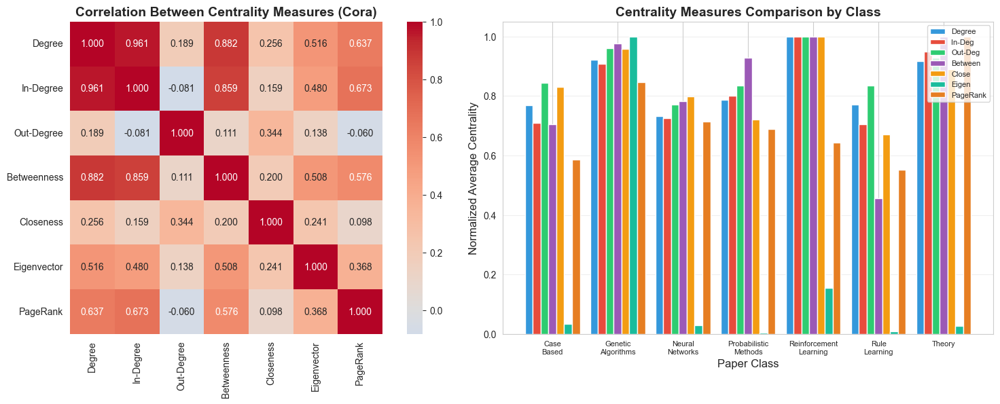


KEY CENTRALITY INSIGHTS - CORA

📊 Correlation Analysis:
  • In-Degree ↔ PageRank: 0.673
  • In-Degree ↔ Eigenvector: 0.480
  • Out-Degree ↔ Betweenness: 0.111
  • PageRank ↔ Eigenvector: 0.368

📚 Top class by each centrality:
  • Degree Centrality: Reinforcement_Learning
  • In Degree Centrality: Reinforcement_Learning
  • Out Degree Centrality: Reinforcement_Learning
  • Betweenness Centrality: Reinforcement_Learning
  • Closeness Centrality: Reinforcement_Learning
  • Eigenvector Centrality: Genetic_Algorithms
  • Pagerank: Theory


In [22]:
# =============================================================================
# CENTRALITY CORRELATION ANALYSIS - CORA
# =============================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 1. Correlation Heatmap for all centrality measures
centrality_cols = ['degree_centrality', 'in_degree_centrality', 'out_degree_centrality',
                   'betweenness_centrality', 'closeness_centrality', 
                   'eigenvector_centrality', 'pagerank']
corr_matrix = cora_centrality_df[centrality_cols].corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            ax=axes[0], fmt='.3f', square=True, 
            xticklabels=['Degree', 'In-Degree', 'Out-Degree', 'Betweenness', 
                        'Closeness', 'Eigenvector', 'PageRank'],
            yticklabels=['Degree', 'In-Degree', 'Out-Degree', 'Betweenness', 
                         'Closeness', 'Eigenvector', 'PageRank'])
axes[0].set_title('Correlation Between Centrality Measures (Cora)', fontsize=14, fontweight='bold')

# 2. Average centrality by class (normalized bar chart)
avg_by_class = cora_centrality_df.groupby('class_label')[
    ['degree_centrality', 'in_degree_centrality', 'out_degree_centrality',
     'betweenness_centrality', 'closeness_centrality', 
     'eigenvector_centrality', 'pagerank']
].mean()

# Normalize for comparison
avg_normalized = avg_by_class / avg_by_class.max()

x = np.arange(len(cora_classes))
width = 0.12

measures = ['degree_centrality', 'in_degree_centrality', 'out_degree_centrality',
            'betweenness_centrality', 'closeness_centrality', 
            'eigenvector_centrality', 'pagerank']
measure_labels = ['Degree', 'In-Deg', 'Out-Deg', 'Between', 'Close', 'Eigen', 'PageRank']
colors_list = ['#3498db', '#e74c3c', '#2ecc71', '#9b59b6', '#f39c12', '#1abc9c', '#e67e22']

for i, (measure, label, color) in enumerate(zip(measures, measure_labels, colors_list)):
    offset = (i - 3) * width
    axes[1].bar(x + offset, avg_normalized[measure], width, label=label, color=color)

axes[1].set_xlabel('Paper Class', fontsize=12)
axes[1].set_ylabel('Normalized Average Centrality', fontsize=12)
axes[1].set_title('Centrality Measures Comparison by Class', fontsize=14, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels([c.replace('_', '\n') for c in cora_classes], rotation=0, ha='center', fontsize=8)
axes[1].legend(loc='upper right', fontsize=8)
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('cora_centrality_correlation_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Print key insights
print("\n" + "="*70)
print("KEY CENTRALITY INSIGHTS - CORA")
print("="*70)
print("\n📊 Correlation Analysis:")
print(f"  • In-Degree ↔ PageRank: {corr_matrix.loc['in_degree_centrality', 'pagerank']:.3f}")
print(f"  • In-Degree ↔ Eigenvector: {corr_matrix.loc['in_degree_centrality', 'eigenvector_centrality']:.3f}")
print(f"  • Out-Degree ↔ Betweenness: {corr_matrix.loc['out_degree_centrality', 'betweenness_centrality']:.3f}")
print(f"  • PageRank ↔ Eigenvector: {corr_matrix.loc['pagerank', 'eigenvector_centrality']:.3f}")

print("\n📚 Top class by each centrality:")
for col in ['degree_centrality', 'in_degree_centrality', 'out_degree_centrality',
            'betweenness_centrality', 'closeness_centrality', 
            'eigenvector_centrality', 'pagerank']:
    top_class = avg_by_class[col].idxmax()
    print(f"  • {col.replace('_', ' ').title()}: {top_class}")


CREATING CENTRALITY VISUALIZATION FOR CORA NETWORK
Showing how the network looks under different centrality measures
Color scale: Purple (low) → Blue → Green → Yellow → Orange → Red (high)

📊 Processing In-Degree centrality...
   Top node: 35, Subgraph: 250 nodes, 420 edges
📊 Processing PageRank centrality...
   Top node: 35, Subgraph: 250 nodes, 421 edges
📊 Processing Betweenness centrality...
   Top node: 35, Subgraph: 250 nodes, 469 edges
📊 Processing Closeness centrality...
   Top node: 35, Subgraph: 250 nodes, 512 edges
📊 Processing Eigenvector centrality...
   Top node: 35, Subgraph: 250 nodes, 580 edges


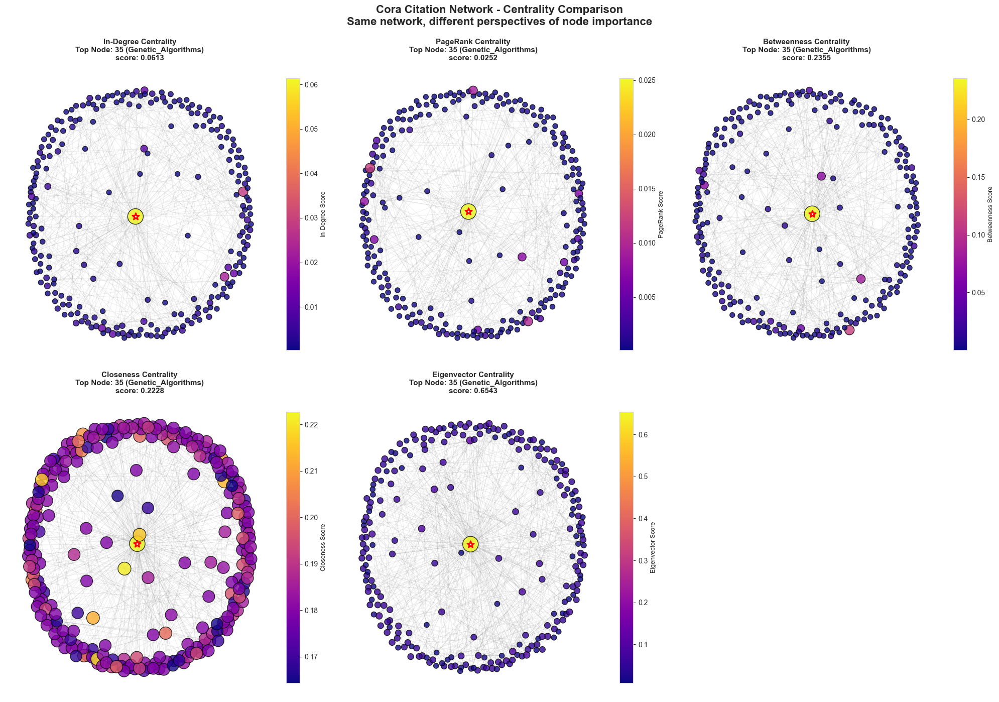


✅ Visualization saved to 'cora_centrality_comparison.png'


In [25]:
# =============================================================================
# NETWORK VISUALIZATION BY CENTRALITY - CORA
# =============================================================================

print("="*70)
print("CREATING CENTRALITY VISUALIZATION FOR CORA NETWORK")
print("="*70)
print("Showing how the network looks under different centrality measures")
print("Color scale: Purple (low) → Blue → Green → Yellow → Orange → Red (high)\n")

import matplotlib.cm as cm
from matplotlib.colors import Normalize

def create_centrality_subgraph_cora(G, centrality_dict, top_node, k_neighbors=2, max_nodes=300):
    """
    Create a subgraph centered on the top node and its k-hop neighbors
    """
    nodes_to_include = {top_node}
    
    # Add k-hop neighbors
    for k in range(k_neighbors):
        new_neighbors = set()
        for node in nodes_to_include:
            neighbors = set(G.neighbors(node))
            new_neighbors.update(neighbors)
        nodes_to_include.update(new_neighbors)
        
        if len(nodes_to_include) > max_nodes:
            sorted_nodes = sorted(nodes_to_include, 
                                 key=lambda n: centrality_dict.get(n, 0), 
                                 reverse=True)[:max_nodes]
            nodes_to_include = set(sorted_nodes)
            break
    
    return G.subgraph(nodes_to_include).copy()

# Define centrality measures to visualize
centrality_measures = {
    'In-Degree': 'in_degree_centrality',
    'PageRank': 'pagerank',
    'Betweenness': 'betweenness_centrality',
    'Closeness': 'closeness_centrality',
    'Eigenvector': 'eigenvector_centrality'
}

# Create figure with subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

# Color map
cmap = cm.get_cmap('plasma')

# Color map for classes (needed for node coloring by class)
class_colors = plt.cm.Set3(np.linspace(0, 1, len(cora_classes)))
class_color_map = dict(zip(cora_classes, class_colors))

for idx, (measure_name, measure_col) in enumerate(centrality_measures.items()):
    ax = axes[idx]
    
    print(f"📊 Processing {measure_name} centrality...")
    
    # Create dictionary of centrality values
    cent_dict = dict(zip(cora_centrality_df['node'], cora_centrality_df[measure_col]))
    
    # Find top node for this measure
    top_node = cora_centrality_df.loc[cora_centrality_df[measure_col].idxmax(), 'node']
    
    # Create subgraph centered on top node
    G_sub = create_centrality_subgraph_cora(G_cora_undirected, cent_dict, top_node, 
                                            k_neighbors=2, max_nodes=250)
    
    print(f"   Top node: {int(top_node)}, Subgraph: {G_sub.number_of_nodes()} nodes, {G_sub.number_of_edges()} edges")
    
    # Get centrality values for nodes in subgraph
    node_centralities = [cent_dict.get(n, 0) for n in G_sub.nodes()]
    
    # Normalize colors
    norm = Normalize(vmin=min(node_centralities), vmax=max(node_centralities))
    node_colors = [cmap(norm(c)) for c in node_centralities]
    
    # Node sizes based on centrality
    node_sizes = [50 + 300 * cent_dict.get(n, 0) / max(node_centralities) for n in G_sub.nodes()]
    
    # Make the top node stand out
    for i, node in enumerate(G_sub.nodes()):
        if node == top_node:
            node_sizes[i] = 500
            break
    
    # Color nodes by class for additional information
    node_class_colors = []
    for node in G_sub.nodes():
        class_label = G_cora.nodes[node].get('class_label', 'Unknown')
        if class_label in class_color_map:
            node_class_colors.append(class_color_map[class_label])
        else:
            node_class_colors.append('gray')
    
    # Layout
    pos = nx.spring_layout(G_sub, k=1.5, iterations=50, seed=42)
    
    # Draw network
    nx.draw_networkx_edges(G_sub, pos, alpha=0.2, edge_color='gray', width=0.5, ax=ax)
    nx.draw_networkx_nodes(G_sub, pos, node_color=node_colors, node_size=node_sizes, 
                           alpha=0.8, ax=ax, edgecolors='black', linewidths=1)
    
    # Highlight top node with a star
    top_pos = {top_node: pos[top_node]}
    nx.draw_networkx_nodes(top_pos, pos, node_color='white', node_size=100, 
                           node_shape='*', ax=ax, edgecolors='red', linewidths=2)
    
    # Add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(f'{measure_name} Score', fontsize=9)
    
    # Title
    top_cent_value = cent_dict.get(top_node, 0)
    top_class = G_cora.nodes[top_node].get('class_label', 'Unknown')
    ax.set_title(f'{measure_name} Centrality\nTop Node: {int(top_node)} ({top_class})\nscore: {top_cent_value:.4f}', 
                 fontsize=11, fontweight='bold')
    ax.axis('off')

# Remove extra subplot
axes[5].axis('off')

plt.suptitle('Cora Citation Network - Centrality Comparison\n' + 
             'Same network, different perspectives of node importance', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('cora_centrality_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Visualization saved to 'cora_centrality_comparison.png'")


In [29]:
# =============================================================================
# COMMUNITY DETECTION - CORA
# =============================================================================
# Apply community detection algorithms to the Cora network

print("="*70)
print("COMMUNITY DETECTION - CORA CITATION NETWORK")
print("="*70)
print("""
Applying community detection algorithms:
1. Louvain Method - Fast modularity optimization
2. Label Propagation - Simple, semi-supervised approach

Note: We use the undirected version of the graph for community detection.
""")

# Store results
cora_community_results = {
    'louvain': {},
    'label_propagation': {}
}

# Use undirected graph for community detection
print(f"\nNetwork size: {G_cora_undirected.number_of_nodes()} nodes, {G_cora_undirected.number_of_edges()} edges")

# -------------------------
# 1. LOUVAIN METHOD
# -------------------------
print(f"\nApplying Louvain...")
louvain_partition = community_louvain.best_partition(G_cora_undirected, random_state=42)
louvain_modularity = community_louvain.modularity(louvain_partition, G_cora_undirected)

# Convert to community sets
louvain_communities = {}
for node, comm_id in louvain_partition.items():
    if comm_id not in louvain_communities:
        louvain_communities[comm_id] = set()
    louvain_communities[comm_id].add(node)

louvain_sets = list(louvain_communities.values())

print(f"   Communities found: {len(louvain_sets)}")
print(f"   Modularity: {louvain_modularity:.4f}")

# -------------------------
# 2. LABEL PROPAGATION
# -------------------------
print(f"\nApplying Label Propagation...")

# Run multiple times and take best
best_lp_modularity = -1
best_lp_communities = None

for seed in range(5):
    lp_communities_gen = nx_community.label_propagation_communities(G_cora_undirected)
    lp_communities_list = list(lp_communities_gen)
    
    # Convert to partition for modularity calculation
    lp_partition = {}
    for comm_id, comm_nodes in enumerate(lp_communities_list):
        for node in comm_nodes:
            lp_partition[node] = comm_id
    
    mod = community_louvain.modularity(lp_partition, G_cora_undirected)
    if mod > best_lp_modularity:
        best_lp_modularity = mod
        best_lp_communities = lp_communities_list

print(f"   Communities found: {len(best_lp_communities)}")
print(f"   Modularity: {best_lp_modularity:.4f}")

# Store results
cora_community_results['louvain'] = {
    'partition': louvain_partition,
    'communities': louvain_sets,
    'modularity': louvain_modularity,
    'num_communities': len(louvain_sets)
}

cora_community_results['label_propagation'] = {
    'communities': best_lp_communities,
    'modularity': best_lp_modularity,
    'num_communities': len(best_lp_communities)
}

print("\n" + "="*70)
print("COMMUNITY DETECTION COMPLETE")
print("="*70)


COMMUNITY DETECTION - CORA CITATION NETWORK

Applying community detection algorithms:
1. Louvain Method - Fast modularity optimization
2. Label Propagation - Simple, semi-supervised approach

Note: We use the undirected version of the graph for community detection.


Network size: 2708 nodes, 5278 edges

Applying Louvain...
   Communities found: 101
   Modularity: 0.8146

Applying Label Propagation...
   Communities found: 502
   Modularity: 0.6505

COMMUNITY DETECTION COMPLETE


EVALUATING COMMUNITY QUALITY - CORA NETWORK

QUALITY METRICS BY ALGORITHM

Metrics explained:
  • Modularity: Higher is better (range: -0.5 to 1)
  • Coverage: Higher is better (range: 0 to 1)
  • Avg Internal Density: Higher is better
  • Avg Conductance: Lower is better (measures separation)


           algorithm  num_communities  modularity  coverage  \
0            louvain              101      0.8146    0.8850   
1  label_propagation              502      0.6505    0.6726   

   avg_internal_density  avg_conductance  
0                0.7250           0.0264  
1                0.7459           0.3609  

COMPARING DETECTED COMMUNITIES WITH GROUND TRUTH CLASSES

LOUVAIN:
   Purity (alignment with ground truth classes): 0.7758
   Modularity: 0.8146

LABEL_PROPAGATION:
   Purity (alignment with ground truth classes): 0.8781
   Modularity: 0.6505


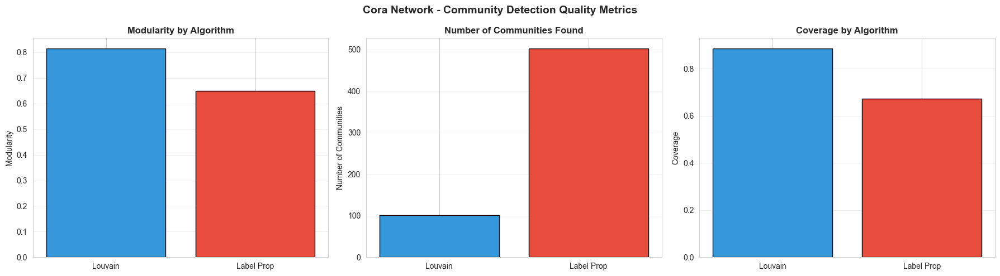


✅ Community quality visualization saved to 'cora_community_quality_comparison.png'


In [32]:
# =============================================================================
# COMMUNITY QUALITY EVALUATION - CORA
# =============================================================================

print("="*70)
print("EVALUATING COMMUNITY QUALITY - CORA NETWORK")
print("="*70)

# Evaluate both algorithms
cora_quality_results = []

for algorithm in ['louvain', 'label_propagation']:
    communities = cora_community_results[algorithm]['communities']
    modularity = cora_community_results[algorithm]['modularity']
    
    # Evaluate quality
    metrics = evaluate_community_quality(G_cora_undirected, communities, 'Cora')
    metrics['algorithm'] = algorithm
    metrics['modularity'] = modularity
    
    cora_quality_results.append(metrics)

# Create DataFrame
cora_quality_df = pd.DataFrame(cora_quality_results)

# Display results
print("\n" + "="*70)
print("QUALITY METRICS BY ALGORITHM")
print("="*70)
print("\nMetrics explained:")
print("  • Modularity: Higher is better (range: -0.5 to 1)")
print("  • Coverage: Higher is better (range: 0 to 1)")
print("  • Avg Internal Density: Higher is better")
print("  • Avg Conductance: Lower is better (measures separation)")
print("\n")

print(cora_quality_df[['algorithm', 'num_communities', 'modularity', 'coverage', 
                       'avg_internal_density', 'avg_conductance']].round(4))

# Compare detected communities with ground truth classes
print("\n" + "="*70)
print("COMPARING DETECTED COMMUNITIES WITH GROUND TRUTH CLASSES")
print("="*70)

def calculate_class_purity(communities, label_map):
    """
    Calculate the purity of communities with respect to ground truth classes
    """
    total_purity = 0
    for comm in communities:
        if len(comm) == 0:
            continue
        # Get class labels for nodes in this community
        comm_labels = [label_map.get(node, 'Unknown') for node in comm]
        # Find most common class
        most_common_class = Counter(comm_labels).most_common(1)[0][1]
        purity = most_common_class / len(comm)
        total_purity += purity * len(comm)
    
    return total_purity / sum(len(c) for c in communities)

# Calculate purity for both algorithms
for algorithm in ['louvain', 'label_propagation']:
    communities = cora_community_results[algorithm]['communities']
    purity = calculate_class_purity(communities, cora_label_map)
    print(f"\n{algorithm.upper()}:")
    print(f"   Purity (alignment with ground truth classes): {purity:.4f}")
    print(f"   Modularity: {cora_community_results[algorithm]['modularity']:.4f}")

# Visualize quality metrics
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

algorithms = ['louvain', 'label_propagation']
algo_labels = ['Louvain', 'Label Prop']

# 1. Modularity
modularities = [cora_quality_df[cora_quality_df['algorithm'] == algo]['modularity'].values[0] 
                for algo in algorithms]
axes[0].bar(algo_labels, modularities, color=['#3498db', '#e74c3c'], edgecolor='black')
axes[0].set_ylabel('Modularity')
axes[0].set_title('Modularity by Algorithm', fontsize=12, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

# 2. Number of Communities
num_comms = [cora_quality_df[cora_quality_df['algorithm'] == algo]['num_communities'].values[0] 
             for algo in algorithms]
axes[1].bar(algo_labels, num_comms, color=['#3498db', '#e74c3c'], edgecolor='black')
axes[1].set_ylabel('Number of Communities')
axes[1].set_title('Number of Communities Found', fontsize=12, fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='y')

# 3. Coverage
coverages = [cora_quality_df[cora_quality_df['algorithm'] == algo]['coverage'].values[0] 
             for algo in algorithms]
axes[2].bar(algo_labels, coverages, color=['#3498db', '#e74c3c'], edgecolor='black')
axes[2].set_ylabel('Coverage')
axes[2].set_title('Coverage by Algorithm', fontsize=12, fontweight='bold')
axes[2].grid(True, alpha=0.3, axis='y')

plt.suptitle('Cora Network - Community Detection Quality Metrics', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('cora_community_quality_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Community quality visualization saved to 'cora_community_quality_comparison.png'")


VISUALIZING LOUVAIN COMMUNITIES FOR CORA NETWORK
Sampled to 1052 nodes for visualization


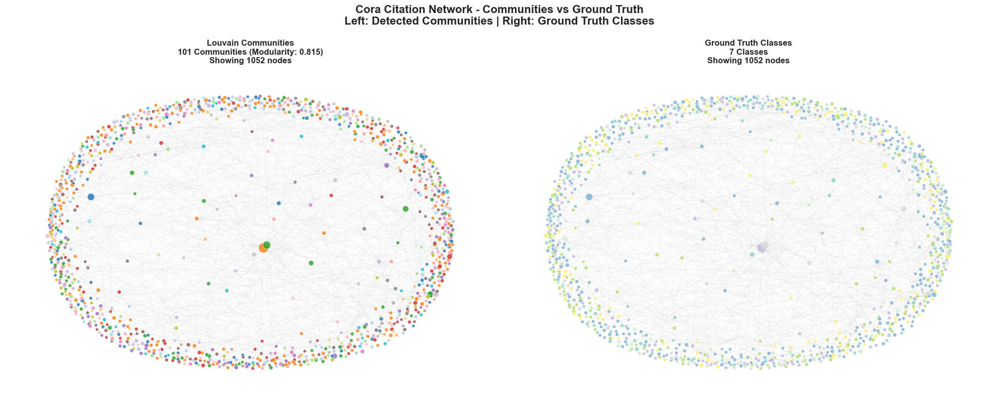


✅ Community visualization saved to 'cora_communities_vs_ground_truth.png'

Observations:
  • Left plot: Each color represents a detected community
  • Right plot: Each color represents a ground truth class
  • Compare the two to see how well communities align with paper classes


In [33]:
# =============================================================================
# VISUALIZE DETECTED COMMUNITIES - CORA
# =============================================================================

print("="*70)
print("VISUALIZING LOUVAIN COMMUNITIES FOR CORA NETWORK")
print("="*70)

# Color map for classes (needed for ground truth visualization)
class_colors = plt.cm.Set3(np.linspace(0, 1, len(cora_classes)))
class_color_map = dict(zip(cora_classes, class_colors))

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Get Louvain partition
louvain_partition = cora_community_results['louvain']['partition']
communities = cora_community_results['louvain']['communities']

# Sample nodes if network is too large for visualization
if G_cora_undirected.number_of_nodes() > 1000:
    # Sample proportionally from each community
    sampled_nodes = set()
    sorted_comms = sorted(communities, key=len, reverse=True)[:20]  # Top 20 communities
    
    for comm in sorted_comms:
        # Sample from community
        sample_size = min(len(comm), max(30, int(len(comm) * 0.4)))
        sampled = list(comm)[:sample_size]
        sampled_nodes.update(sampled)
    
    G_viz = G_cora_undirected.subgraph(sampled_nodes).copy()
    print(f"Sampled to {G_viz.number_of_nodes()} nodes for visualization")
else:
    G_viz = G_cora_undirected.copy()

# Assign colors to communities
unique_communities = list(set(louvain_partition[n] for n in G_viz.nodes()))
num_communities = len(unique_communities)

# Use tab20 colormap for distinct colors
if num_communities <= 20:
    comm_cmap = plt.cm.tab20
else:
    comm_cmap = plt.cm.hsv

community_colors = {comm: comm_cmap(i / num_communities) 
                   for i, comm in enumerate(unique_communities)}

node_colors_comm = [community_colors[louvain_partition[n]] for n in G_viz.nodes()]

# Node sizes based on degree
node_sizes = [min(G_viz.degree(n) * 3 + 20, 200) for n in G_viz.nodes()]

# Layout
pos = nx.spring_layout(G_viz, k=1.0, iterations=50, seed=42)

# Plot 1: Communities
ax = axes[0]
nx.draw_networkx_edges(G_viz, pos, alpha=0.1, edge_color='gray', width=0.3, ax=ax)
nx.draw_networkx_nodes(G_viz, pos, node_color=node_colors_comm, node_size=node_sizes, 
                       alpha=0.8, ax=ax, edgecolors='white', linewidths=0.5)

actual_num_comms = len(communities)
modularity = cora_community_results['louvain']['modularity']

ax.set_title(f'Louvain Communities\n{actual_num_comms} Communities (Modularity: {modularity:.3f})\n' +
             f'Showing {G_viz.number_of_nodes()} nodes', 
             fontsize=12, fontweight='bold')
ax.axis('off')

# Plot 2: Ground Truth Classes
ax = axes[1]
node_colors_class = [class_color_map.get(G_cora.nodes[n].get('class_label', 'Unknown'), 'gray') 
                     for n in G_viz.nodes()]

nx.draw_networkx_edges(G_viz, pos, alpha=0.1, edge_color='gray', width=0.3, ax=ax)
nx.draw_networkx_nodes(G_viz, pos, node_color=node_colors_class, node_size=node_sizes, 
                       alpha=0.8, ax=ax, edgecolors='white', linewidths=0.5)

ax.set_title(f'Ground Truth Classes\n{len(cora_classes)} Classes\n' +
             f'Showing {G_viz.number_of_nodes()} nodes', 
             fontsize=12, fontweight='bold')
ax.axis('off')

plt.suptitle('Cora Citation Network - Communities vs Ground Truth\n' + 
             'Left: Detected Communities | Right: Ground Truth Classes', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('cora_communities_vs_ground_truth.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Community visualization saved to 'cora_communities_vs_ground_truth.png'")
print("\nObservations:")
print("  • Left plot: Each color represents a detected community")
print("  • Right plot: Each color represents a ground truth class")
print("  • Compare the two to see how well communities align with paper classes")


In [ ]:
#TODO: apply leiden community detection to the cora network and compare the results with the louvain method (both cora and twitch)
#TODO: apply community detection on each paper class to detect more niche communities with a specialized field of study
#TODO: check if we need to add more centrality measures to the analysis + more niche stats and interesting examples 
#TODO: apply the same analysis and centrality measure to per-paper class network
#TODO: check visualizations if they can be clearer
#TODO: write explanations, observations, and documentation for the code
#